<a href="https://colab.research.google.com/github/irsadbacanak/abdomen/blob/main/abdomen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


dcomdan pngye dönüştürme scripti
Kontrast ve görüntü ayarlarıda yapıldı


In [ ]:
import os
try:
    import pydicom
except ModuleNotFoundError:
    !pip install pydicom
    import pydicom
try:
    import cv2
except ModuleNotFoundError:
    !pip install opencv-python
    import cv2
import numpy as np
from tqdm import tqdm

SRC_ROOT = "/content/drive/MyDrive/abdomen/images_raw"
DST_ROOT = "/content/drive/MyDrive/abdomen/prototip/images_png"
WL, WW = 40, 400

# Convert all patients for the full dataset preparation
PATIENTS = sorted(os.listdir(SRC_ROOT))

def window(ds):
    arr = ds.pixel_array.astype(np.float32)
    if arr.ndim == 3:
        arr = arr[0]
    slope = getattr(ds, 'RescaleSlope', 1.0)
    intercept = getattr(ds, 'RescaleIntercept', 0.0)
    arr = arr * slope + intercept
    arr = np.clip(arr, WL-WW//2, WL+WW//2)
    if arr.max() > arr.min():
        arr = ((arr-arr.min())/(arr.max()-arr.min())*255).astype(np.uint8)
    else:
        arr = np.zeros_like(arr, dtype=np.uint8)
    return arr

skipped_files = []

for pid in tqdm(PATIENTS, desc="Patients"):
    pdir = os.path.join(SRC_ROOT, pid)
    if not os.path.isdir(pdir):
        continue

    out_dir = os.path.join(DST_ROOT, pid)
    os.makedirs(out_dir, exist_ok=True)

    # ————————————
    # Eğer out_dir içinde hiç olmazsa bir .png dosyası varsa,
    # bu hasta dizinini tamamen atla:
    # existing_pngs = [f for f in os.listdir(out_dir) if f.lower().endswith(".png")]
    # if existing_pngs:
    #     # tqdm.write ile konsola bilgi mesajı da yazdırabilirsin:
    #     tqdm.write(f"Skipping patient {pid}: already converted ({len(existing_pngs)} PNG found)")
    #     continue
    # ————————————

    files = sorted(
        [f for f in os.listdir(pdir) if f.endswith(".dcm")],
        key=lambda x: int(x.split('.')[0])
    )

    for f in files:
        try:
            ds = pydicom.dcmread(os.path.join(pdir, f))
            img = window(ds)
            out_path = os.path.join(out_dir, f.replace('.dcm','.png'))
            # (Bu satır artık her dosya için ekstra kontrol; isteğe bağlı)
            # if os.path.exists(out_path):
            #     continue
            if img is not None and img.ndim == 2 and img.size > 0:
                cv2.imwrite(out_path, img)
            else:
                # print(f"Skipping {f}: invalid image ({img.shape if img is not None else 'None'})")
                skipped_files.append(os.path.join(pdir, f))
        except Exception as e:
            # print(f"Error processing {f}: {e}")
            skipped_files.append(os.path.join(pdir, f))

if skipped_files:
    with open("skipped_files.log", "w") as logf:
        for item in skipped_files:
            logf.write(f"{item}\n")
    print(f"{len(skipped_files)} file(s) skipped. See skipped_files.log for details.")
else:
    print("All files processed successfully.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 20.5 MB/s eta 0:00:00


Patients:   5%|▍         | 23/503 [00:00<00:02, 220.02it/s]

Skipping patient 20001: already converted (19 PNG found)
Skipping patient 20002: already converted (232 PNG found)
Skipping patient 20003: already converted (646 PNG found)
Skipping patient 20004: already converted (132 PNG found)
Skipping patient 20005: already converted (146 PNG found)
Skipping patient 20006: already converted (85 PNG found)
Skipping patient 20007: already converted (149 PNG found)
Skipping patient 20008: already converted (416 PNG found)
Skipping patient 20009: already converted (163 PNG found)
Skipping patient 20010: already converted (583 PNG found)
Skipping patient 20011: already converted (169 PNG found)
Skipping patient 20012: already converted (180 PNG found)
Skipping patient 20013: already converted (466 PNG found)
Skipping patient 20014: already converted (416 PNG found)
Skipping patient 20015: already converted (86 PNG found)
Skipping patient 20016: already converted (405 PNG found)
Skipping patient 20017: already converted (207 PNG found)
Skipping patient 

Patients:  13%|█▎        | 66/503 [00:00<00:02, 180.18it/s]

Skipping patient 20042: already converted (88 PNG found)
Skipping patient 20043: already converted (92 PNG found)
Skipping patient 20044: already converted (363 PNG found)
Skipping patient 20045: already converted (176 PNG found)
Skipping patient 20046: already converted (560 PNG found)
Skipping patient 20047: already converted (330 PNG found)
Skipping patient 20048: already converted (421 PNG found)
Skipping patient 20049: already converted (161 PNG found)
Skipping patient 20050: already converted (224 PNG found)
Skipping patient 20051: already converted (224 PNG found)
Skipping patient 20052: already converted (559 PNG found)
Skipping patient 20053: already converted (514 PNG found)
Skipping patient 20054: already converted (153 PNG found)
Skipping patient 20055: already converted (511 PNG found)
Skipping patient 20056: already converted (105 PNG found)
Skipping patient 20057: already converted (237 PNG found)
Skipping patient 20058: already converted (97 PNG found)
Skipping patient 

Patients:  21%|██        | 104/503 [00:00<00:02, 177.28it/s]

Skipping patient 20076: already converted (158 PNG found)
Skipping patient 20077: already converted (1571 PNG found)
Skipping patient 20078: already converted (172 PNG found)
Skipping patient 20079: already converted (141 PNG found)
Skipping patient 20080: already converted (99 PNG found)
Skipping patient 20081: already converted (96 PNG found)
Skipping patient 20082: already converted (179 PNG found)
Skipping patient 20083: already converted (163 PNG found)
Skipping patient 20084: already converted (189 PNG found)
Skipping patient 20085: already converted (213 PNG found)
Skipping patient 20086: already converted (527 PNG found)
Skipping patient 20087: already converted (119 PNG found)
Skipping patient 20088: already converted (181 PNG found)
Skipping patient 20089: already converted (480 PNG found)
Skipping patient 20090: already converted (146 PNG found)
Skipping patient 20091: already converted (245 PNG found)
Skipping patient 20092: already converted (1004 PNG found)
Skipping patie

Patients:  29%|██▉       | 147/503 [00:00<00:01, 190.75it/s]

Skipping patient 20113: already converted (424 PNG found)
Skipping patient 20114: already converted (172 PNG found)
Skipping patient 20115: already converted (172 PNG found)
Skipping patient 20116: already converted (175 PNG found)
Skipping patient 20117: already converted (595 PNG found)
Skipping patient 20118: already converted (166 PNG found)
Skipping patient 20119: already converted (110 PNG found)
Skipping patient 20120: already converted (99 PNG found)
Skipping patient 20121: already converted (414 PNG found)
Skipping patient 20122: already converted (52 PNG found)
Skipping patient 20123: already converted (166 PNG found)
Skipping patient 20124: already converted (110 PNG found)
Skipping patient 20125: already converted (71 PNG found)
Skipping patient 20126: already converted (141 PNG found)
Skipping patient 20127: already converted (299 PNG found)
Skipping patient 20128: already converted (367 PNG found)
Skipping patient 20129: already converted (474 PNG found)
Skipping patient 

Skipping patient 20153: already converted (2378 PNG found)
Skipping patient 20154: already converted (108 PNG found)
Skipping patient 20155: already converted (98 PNG found)
Skipping patient 20156: already converted (144 PNG found)
Skipping patient 20157: already converted (103 PNG found)
Skipping patient 20158: already converted (95 PNG found)
Skipping patient 20159: already converted (186 PNG found)
Skipping patient 20160: already converted (352 PNG found)
Skipping patient 20161: already converted (95 PNG found)
Skipping patient 20162: already converted (135 PNG found)
Skipping patient 20163: already converted (166 PNG found)
Skipping patient 20164: already converted (386 PNG found)
Skipping patient 20165: already converted (161 PNG found)
Skipping patient 20166: already converted (530 PNG found)
Skipping patient 20167: already converted (961 PNG found)
Skipping patient 20168: already converted (123 PNG found)
Skipping patient 20169: already converted (281 PNG found)
Skipping patient

Patients:  42%|████▏     | 210/503 [00:01<00:01, 184.62it/s]

Skipping patient 20194: already converted (87 PNG found)
Skipping patient 20195: already converted (150 PNG found)
Skipping patient 20196: already converted (174 PNG found)
Skipping patient 20197: already converted (195 PNG found)
Skipping patient 20198: already converted (147 PNG found)
Skipping patient 20199: already converted (472 PNG found)
Skipping patient 20200: already converted (98 PNG found)
Skipping patient 20201: already converted (193 PNG found)
Skipping patient 20202: already converted (184 PNG found)
Skipping patient 20203: already converted (149 PNG found)
Skipping patient 20204: already converted (116 PNG found)
Skipping patient 20205: already converted (81 PNG found)
Skipping patient 20206: already converted (154 PNG found)
Skipping patient 20207: already converted (209 PNG found)
Skipping patient 20208: already converted (285 PNG found)
Skipping patient 20209: already converted (487 PNG found)
Skipping patient 20210: already converted (382 PNG found)
Skipping patient 

Patients:  50%|█████     | 252/503 [00:01<00:01, 186.57it/s]

Skipping patient 20225: already converted (427 PNG found)
Skipping patient 20226: already converted (377 PNG found)
Skipping patient 20227: already converted (249 PNG found)
Skipping patient 20228: already converted (151 PNG found)
Skipping patient 20229: already converted (228 PNG found)
Skipping patient 20230: already converted (485 PNG found)
Skipping patient 20231: already converted (408 PNG found)
Skipping patient 20232: already converted (102 PNG found)
Skipping patient 20233: already converted (110 PNG found)
Skipping patient 20234: already converted (320 PNG found)
Skipping patient 20235: already converted (417 PNG found)
Skipping patient 20236: already converted (100 PNG found)
Skipping patient 20237: already converted (128 PNG found)
Skipping patient 20238: already converted (99 PNG found)
Skipping patient 20239: already converted (90 PNG found)
Skipping patient 20240: already converted (222 PNG found)
Skipping patient 20241: already converted (110 PNG found)
Skipping patient

Patients:  58%|█████▊    | 294/503 [00:01<00:01, 184.26it/s]

Skipping patient 20269: already converted (460 PNG found)
Skipping patient 20270: already converted (183 PNG found)
Skipping patient 20271: already converted (85 PNG found)
Skipping patient 20272: already converted (197 PNG found)
Skipping patient 20273: already converted (112 PNG found)
Skipping patient 20274: already converted (472 PNG found)
Skipping patient 20275: already converted (304 PNG found)
Skipping patient 20276: already converted (172 PNG found)
Skipping patient 20277: already converted (238 PNG found)
Skipping patient 20278: already converted (497 PNG found)
Skipping patient 20279: already converted (489 PNG found)
Skipping patient 20280: already converted (419 PNG found)
Skipping patient 20281: already converted (150 PNG found)
Skipping patient 20282: already converted (322 PNG found)
Skipping patient 20283: already converted (92 PNG found)
Skipping patient 20284: already converted (119 PNG found)
Skipping patient 20285: already converted (193 PNG found)
Skipping patient

Skipping patient 20304: already converted (342 PNG found)
Skipping patient 20305: already converted (395 PNG found)
Skipping patient 20306: already converted (361 PNG found)
Skipping patient 20307: already converted (108 PNG found)
Skipping patient 20308: already converted (344 PNG found)
Skipping patient 20309: already converted (249 PNG found)
Skipping patient 20310: already converted (551 PNG found)
Skipping patient 20311: already converted (401 PNG found)
Skipping patient 20312: already converted (336 PNG found)
Skipping patient 20313: already converted (409 PNG found)
Skipping patient 20314: already converted (1381 PNG found)
Skipping patient 20315: already converted (277 PNG found)
Skipping patient 20316: already converted (94 PNG found)
Skipping patient 20317: already converted (113 PNG found)
Skipping patient 20318: already converted (576 PNG found)
Skipping patient 20319: already converted (422 PNG found)
Skipping patient 20320: already converted (255 PNG found)
Skipping patie

Patients:  75%|███████▍  | 375/503 [00:02<00:00, 195.14it/s]

Skipping patient 20340: already converted (92 PNG found)
Skipping patient 20341: already converted (222 PNG found)
Skipping patient 20342: already converted (193 PNG found)
Skipping patient 20343: already converted (162 PNG found)
Skipping patient 20344: already converted (85 PNG found)
Skipping patient 20345: already converted (97 PNG found)
Skipping patient 20346: already converted (160 PNG found)
Skipping patient 20347: already converted (449 PNG found)
Skipping patient 20348: already converted (143 PNG found)
Skipping patient 20349: already converted (189 PNG found)
Skipping patient 20350: already converted (264 PNG found)
Skipping patient 20351: already converted (345 PNG found)
Skipping patient 20352: already converted (151 PNG found)
Skipping patient 20353: already converted (244 PNG found)
Skipping patient 20354: already converted (293 PNG found)
Skipping patient 20355: already converted (376 PNG found)
Skipping patient 20356: already converted (462 PNG found)
Skipping patient 

Patients:  83%|████████▎ | 419/503 [00:02<00:00, 205.79it/s]

Skipping patient 20384: already converted (86 PNG found)
Skipping patient 20385: already converted (391 PNG found)
Skipping patient 20386: already converted (186 PNG found)
Skipping patient 20387: already converted (226 PNG found)
Skipping patient 20388: already converted (98 PNG found)
Skipping patient 20389: already converted (149 PNG found)
Skipping patient 20390: already converted (96 PNG found)
Skipping patient 20391: already converted (221 PNG found)
Skipping patient 20392: already converted (289 PNG found)
Skipping patient 20393: already converted (47 PNG found)
Skipping patient 20394: already converted (92 PNG found)
Skipping patient 20395: already converted (245 PNG found)
Skipping patient 20396: already converted (95 PNG found)
Skipping patient 20397: already converted (607 PNG found)
Skipping patient 20398: already converted (335 PNG found)
Skipping patient 20399: already converted (164 PNG found)
Skipping patient 20400: already converted (526 PNG found)
Skipping patient 204

Skipping patient 20429: already converted (205 PNG found)
Skipping patient 20430: already converted (267 PNG found)
Skipping patient 20431: already converted (95 PNG found)
Skipping patient 20432: already converted (88 PNG found)
Skipping patient 20433: already converted (494 PNG found)
Skipping patient 20434: already converted (326 PNG found)
Skipping patient 20435: already converted (188 PNG found)
Skipping patient 20436: already converted (91 PNG found)
Skipping patient 20437: already converted (478 PNG found)
Skipping patient 20438: already converted (89 PNG found)
Skipping patient 20439: already converted (96 PNG found)
Skipping patient 20440: already converted (101 PNG found)
Skipping patient 20441: already converted (99 PNG found)
Skipping patient 20442: already converted (106 PNG found)
Skipping patient 20443: already converted (169 PNG found)
Skipping patient 20444: already converted (335 PNG found)
Skipping patient 20445: already converted (311 PNG found)
Skipping patient 204

Patients:  97%|█████████▋| 486/503 [00:02<00:00, 192.16it/s]

Skipping patient 20468: already converted (274 PNG found)
Skipping patient 20469: already converted (335 PNG found)
Skipping patient 20470: already converted (224 PNG found)
Skipping patient 20471: already converted (187 PNG found)
Skipping patient 20472: already converted (338 PNG found)
Skipping patient 20473: already converted (166 PNG found)
Skipping patient 20474: already converted (91 PNG found)
Skipping patient 20475: already converted (98 PNG found)
Skipping patient 20476: already converted (222 PNG found)
Skipping patient 20477: already converted (163 PNG found)
Skipping patient 20478: already converted (862 PNG found)
Skipping patient 20479: already converted (264 PNG found)
Skipping patient 20480: already converted (102 PNG found)
Skipping patient 20481: already converted (99 PNG found)
Skipping patient 20482: already converted (663 PNG found)
Skipping patient 20483: already converted (195 PNG found)
Skipping patient 20484: already converted (397 PNG found)
Skipping patient 

Patients: 100%|██████████| 503/503 [00:02<00:00, 188.67it/s]

Skipping patient 20501: already converted (191 PNG found)
Skipping patient 20502: already converted (167 PNG found)
Skipping patient 20503: already converted (209 PNG found)
All files processed successfully.


DICOM Anotasyon Verisinin Sınıf Dağılımını Görselleştirme Scripti


TRAININGDATA sayfası başarıyla okundu.

İlk 5 satır:


,Case Number,Image Id,Type,Class,Data
0,20001,100007,Bounding Box,ureteral stone,"251,290-262,302"
1,20001,100008,Bounding Box,ureteral stone,"251,291-261,301"
2,20001,100010,Boundary Slice,Kidney-Bladder,NaN
3,20002,100070,Boundary Slice,Kidney-Bladder,NaN
4,20002,100120,Bounding Box,Kidney stone,"337,276-345,282"



Sütun isimleri:
['Case Number', 'Image Id', 'Type', 'Class', 'Data']


/tmp/ipython-input-33-1371397783.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels)


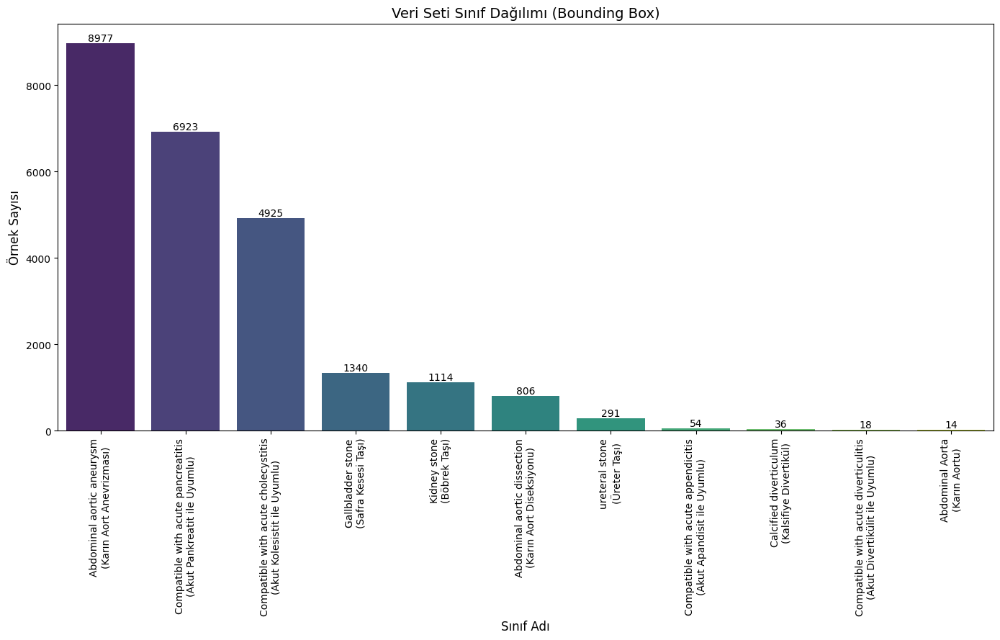


Excel dosyasından hesaplanan sınıf dağılımı:


,count
Class,
Abdominal aortic aneurysm,8977
Compatible with acute pancreatitis,6923
Compatible with acute cholecystitis,4925
Gallbladder stone,1340
Kidney stone,1114
Abdominal aortic dissection,806
ureteral stone,291
Compatible with acute appendicitis,54
Calcified diverticulum,36


In [ ]:
# Gerekli kütüphaneler yükleniyor
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Excel dosyasının yolu
excel_path = "/content/drive/MyDrive/abdomen/Bilgi.xlsx"

# İngilizce sınıf adlarını Türkçeye çevirmek için bir sözlük oluşturuluyor
turkish_classes = {
    "Abdominal Aorta": "Karın Aortu",
    "Abdominal aortic aneurysm": "Karın Aort Anevrizması",
    "Abdominal aortic dissection": "Karın Aort Diseksiyonu",
    "Calcified diverticulum": "Kalsifiye Divertikül",
    "Compatible with acute appendicitis": "Akut Apandisit ile Uyumlu",
    "Compatible with acute cholecystitis": "Akut Kolesistit ile Uyumlu",
    "Compatible with acute diverticulitis": "Akut Divertikülit ile Uyumlu",
    "Compatible with acute pancreatitis": "Akut Pankreatit ile Uyumlu",
    "Gallbladder stone": "Safra Kesesi Taşı",
    "Kidney stone": "Böbrek Taşı",
    "ureteral stone": "Üreter Taşı"
}

try:
    # Excel dosyasından 2. sayfa (sheet_index=1) okunuyor
    # Bu sayfa TRAININGDATA içeriğini barındırıyor
    df_training = pd.read_excel(excel_path, sheet_name=1)

    print("TRAININGDATA sayfası başarıyla okundu.")
    print("\nİlk 5 satır:")
    display(df_training.head())  # Veri kümesinin ilk 5 satırı gösteriliyor
    print("\nSütun isimleri:")
    print(df_training.columns.tolist())  # Tüm sütun adları listeleniyor

    # Sadece 'Type' sütununda değeri 'Bounding Box' olan satırlar seçiliyor
    df_bounding_box = df_training[df_training['Type'] == 'Bounding Box'].copy()

    # Her sınıfın kaç kez geçtiğini saymak için 'Class' sütunu sayılıyor
    class_counts = df_bounding_box['Class'].value_counts()

    # Sınıf dağılımını görselleştirmek için bar grafiği oluşturuluyor
    plt.figure(figsize=(14, 9))
    ax = sns.barplot(
        x=class_counts.index,              # Sınıf adları (x ekseni)
        y=class_counts.values,            # Her sınıfın örnek sayısı (y ekseni)
        palette='viridis',                # Renk paleti
        hue=class_counts.index,           # Her çubuğu farklı renklendir
        legend=False                      # Grafik açıklama kutusu gösterilmesin
    )
    plt.xticks(rotation=90)  # X eksenindeki etiketler 90 derece döndürülüyor

    # Her sınıf etiketi altına Türkçesi de eklenecek şekilde etiketler oluşturuluyor
    new_labels = [
        f"{eng}\n({turkish_classes.get(eng, 'Çeviri Bulunamadı')})"
        for eng in class_counts.index
    ]
    ax.set_xticklabels(new_labels)  # Yeni etiketler grafiğe uygulanıyor

    # Grafik başlık ve eksen etiketleri
    plt.xlabel("Sınıf Adı", fontsize=12)
    plt.ylabel("Örnek Sayısı", fontsize=12)
    plt.title("Veri Seti Sınıf Dağılımı (Bounding Box)", fontsize=14)

    # Her çubuğun üstüne değer yazısı ekleniyor
    for p in ax.patches:
        ax.annotate(
            f'{int(p.get_height())}',                         # Yazılacak sayı
            (p.get_x() + p.get_width() / 2., p.get_height()), # Konum
            ha='center', va='center',
            xytext=(0, 5), textcoords='offset points'         # Y ekseninden 5 piksel yukarı
        )

    plt.tight_layout()  # Görselin kenar taşmalarını önler
    plt.show()

    # Sayısal değerler de terminalde yazdırılıyor
    print("\nExcel dosyasından hesaplanan sınıf dağılımı:")
    display(class_counts)

# Hata yönetimi:
except FileNotFoundError:
    # Excel dosyası bulunamazsa kullanıcıya bildirilir
    print(f"Hata: {excel_path} dosyası bulunamadı. Lütfen dosya yolunu kontrol edin.")
except KeyError as e:
    # Excel sayfasında beklenen sütunlardan biri yoksa uyarı verilir
    print(f"Hata: Belirtilen sütun bulunamadı. Detay: {e}")
    print("Lütfen yukarıdaki sütun isimlerini kontrol ederek doğru sütun adını kullandığınızdan emin olun.")
except Exception as e:
    # Diğer tüm olası hatalar buradan yakalanır
    print(f"Beklenmeyen bir hata oluştu: {e}")


Şimdi de her sınıftan rastgele birkaç görüntü örneğini görüntüleyelim. Bunun için etiket dosyalarını okuyup, her sınıfa ait görüntü dosyalarının yollarını bulmamız gerekecek.

Excel'den Bounding Box Etiketlerini Filtreleme Scripti


In [ ]:
# Excel dosyasının tam yolu belirtiliyor
excel_path = "/content/drive/MyDrive/abdomen/Bilgi.xlsx"

# Excel dosyasının 2. sayfası (sheet_name=1) okunarak bir DataFrame'e aktarılıyor
df_bilgi = pd.read_excel(excel_path, sheet_name=1)

# DataFrame'den yalnızca 'Type' sütununda "Bounding Box" olan satırlar filtreleniyor
# Bu, görselde koordinat verilmiş etiketlenmiş verileri ayıklamak için yapılır
df_bounding_box = df_bilgi[df_bilgi['Type'] == 'Bounding Box'].copy()

# Filtrelenmiş DataFrame'in ilk 5 satırı ekrana bastırılıyor (görsel kontrol için)
print("Filtered DataFrame (Bounding Box entries):")
display(df_bounding_box.head())


Filtered DataFrame (Bounding Box entries):


,Case Number,Image Id,Type,Class,Data
0,20001,100007,Bounding Box,ureteral stone,"251,290-262,302"
1,20001,100008,Bounding Box,ureteral stone,"251,291-261,301"
4,20002,100120,Bounding Box,Kidney stone,"337,276-345,282"
5,20002,100206,Bounding Box,ureteral stone,"266,289-273,298"
56,20007,101291,Bounding Box,Kidney stone,"309,330-315,338"


from matplotlib import pyplot as plt
_df_11['Case Number'].plot(kind='hist', bins=20, title='Case Number')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_12['Image Id'].plot(kind='hist', bins=20, title='Image Id')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_13.groupby('Class').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_14.groupby('Data').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_15.plot(kind='scatter', x='Case Number', y='Image Id', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Case Number']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Case Number'}, axis=1)
              .sort_values('Case Number', ascending=True))
  xs = counted['Case Number']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_16.sort_values('Case Number', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Class')):
  _plot_series(series, series_name, i)
  fig.legend(title='Class', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Case Number')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Case Number']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Case Number'}, axis=1)
              .sort_values('Case Number', ascending=True))
  xs = counted['Case Number']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_17.sort_values('Case Number', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Data')):
  _plot_series(series, series_name, i)
  fig.legend(title='Data', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Case Number')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Image Id']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Image Id'}, axis=1)
              .sort_values('Image Id', ascending=True))
  xs = counted['Image Id']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_18.sort_values('Image Id', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Class')):
  _plot_series(series, series_name, i)
  fig.legend(title='Class', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Image Id')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Image Id']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Image Id'}, axis=1)
              .sort_values('Image Id', ascending=True))
  xs = counted['Image Id']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_19.sort_values('Image Id', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Data')):
  _plot_series(series, series_name, i)
  fig.legend(title='Data', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Image Id')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_20['Case Number'].plot(kind='line', figsize=(8, 4), title='Case Number')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_21['Image Id'].plot(kind='line', figsize=(8, 4), title='Image Id')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['Data'].value_counts()
    for x_label, grp in _df_22.groupby('Class')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('Class')
_ = plt.ylabel('Data')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_23['Class'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_23, x='Case Number', y='Class', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_24['Data'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_24, x='Case Number', y='Data', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_25['Class'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_25, x='Image Id', y='Class', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_26['Data'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_26, x='Image Id', y='Data', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

Filtrelenmiş DataFrame'den 'Vaka Numarası' ve 'Resim Kimliği'ne göre resim ve etiket dosyası yollarını oluşturmak için bir fonksiyon oluşturuldu.

DICOM'dan Türetilmiş PNG Görüntüler ve TXT Etiket Dosyalarının Yolu Oluşturma Scripti


In [ ]:
import os

# Ana dizin yolları tanımlanıyor
# Görüntülerin bulunduğu dizin (PNG formatında)
SRC_ROOT = "/content/drive/MyDrive/abdomen/prototip/images_png"

# Etiket (label) dosyalarının bulunduğu dizin (TXT formatında)
LABEL_ROOT = "/content/drive/MyDrive/abdomen/prototip/labels"  # Etiketlerin burada tutulduğu varsayılıyor

def get_file_paths(row):
    """Verilen bir satır (row) için görüntü ve etiket dosya yollarını oluşturur."""
    case_number = row['Case Number']        # Vaka numarası alınır
    image_id = row['Image Id']              # Görüntü ID'si alınır

    # Görüntü dosyasının yolu oluşturuluyor (örneğin: images_png/123/abc123.png)
    image_dir = os.path.join(SRC_ROOT, str(case_number))                         # Vaka klasörü
    image_path = os.path.join(image_dir, f"{image_id}.png")                      # Görüntü dosyasının tam yolu (ImageId.png formatında)

    # Etiket dosyasının yolu oluşturuluyor (örneğin: labels/123_abc123.txt)
    # Etiket dosyalarının [Case Number]_[Image Id].txt biçiminde adlandırıldığı varsayılıyor
    label_path = os.path.join(LABEL_ROOT, f"{case_number}_{image_id}.txt")      # Etiket dosyasının tam yolu

    return image_path, label_path  # Görüntü ve etiket dosya yolları döndürülüyor

# Her satır için get_file_paths fonksiyonu uygulanarak yeni sütunlar oluşturuluyor
# 'image_path' ve 'label_path' isimli iki yeni sütun DataFrame'e ekleniyor
df_bounding_box[['image_path', 'label_path']] = df_bounding_box.apply(get_file_paths, axis=1, result_type='expand')

# Yeni sütunları içeren DataFrame'in ilk 5 satırı ekrana yazdırılıyor
print("Görüntü ve etiket dosya yolları eklenmiş DataFrame:")
display(df_bounding_box.head())


DataFrame with generated file paths:


,Case Number,Image Id,Type,Class,Data,image_path,label_path
0,20001,100007,Bounding Box,ureteral stone,"251,290-262,302",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...
1,20001,100008,Bounding Box,ureteral stone,"251,291-261,301",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...
4,20002,100120,Bounding Box,Kidney stone,"337,276-345,282",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...
5,20002,100206,Bounding Box,ureteral stone,"266,289-273,298",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...
56,20007,101291,Bounding Box,Kidney stone,"309,330-315,338",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...


**Reasoning**:
Check for the existence of image and label files for each row in the dataframe and add boolean columns indicating their existence. Then, print the count of rows where both files exist.



Oluşturulan resim ve etiket dosyalarının gerçekten sürücüde olup olmadığını kontrol et.Veri çerçevesindeki her satır için görüntü ve etiket dosyalarının varlığını kontrol et ve varlıklarını gösteren boolean sütunları ekle. Ardından, her iki dosyanın da bulunduğu satırların sayısını yazdır.

Geçerli Görüntü ve Etiket Eşleşmelerini Doğrulama Scripti


In [ ]:
import os

# Her satır için görüntü ve etiket dosyalarının mevcut olup olmadığı kontrol ediliyor
df_bounding_box['image_exists'] = df_bounding_box['image_path'].apply(os.path.exists)  # Görüntü dosyası mevcut mu?
df_bounding_box['label_exists'] = df_bounding_box['label_path'].apply(os.path.exists)  # Etiket dosyası mevcut mu?

# Hem görüntü hem de etiket dosyası mevcut olan satırlar filtreleniyor
df_valid_files = df_bounding_box[df_bounding_box['image_exists'] & df_bounding_box['label_exists']].copy()

# Toplam Bounding Box (sınırlayıcı kutu) satır sayısı yazdırılıyor
print(f"Toplam bounding box giriş sayısı: {len(df_bounding_box)}")

# Hem görüntü hem de etiket dosyası bulunan geçerli kayıt sayısı yazdırılıyor
print(f"Hem görüntü hem etiket dosyası bulunan kayıt sayısı: {len(df_valid_files)}")

# Geçerli dosya yollarına sahip ilk birkaç satır görselleştiriliyor
print("\nGeçerli dosya yollarını içeren DataFrame:")
display(df_valid_files.head())


Total bounding box entries: 24498
Entries with both image and label files found: 24498

DataFrame with valid file paths:


,Case Number,Image Id,Type,Class,Data,image_path,label_path,image_exists,label_exists
0,20001,100007,Bounding Box,ureteral stone,"251,290-262,302",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...,True,True
1,20001,100008,Bounding Box,ureteral stone,"251,291-261,301",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...,True,True
4,20002,100120,Bounding Box,Kidney stone,"337,276-345,282",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...,True,True
5,20002,100206,Bounding Box,ureteral stone,"266,289-273,298",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...,True,True
56,20007,101291,Bounding Box,Kidney stone,"309,330-315,338",/content/drive/MyDrive/abdomen/prototip/images...,/content/drive/MyDrive/abdomen/prototip/labels...,True,True


Geçerli dosya yolları içeren DataFrame'den belirtilen sayıda örneği rastgele seçin. Çeşitliliği sağlamak için, görselleştirme için işlenecek maksimum sınıf sayısına kadar, her sınıftan birkaç örnek seçmeyi hedefleyin. Bir sınıfın belirtilen sayıdan daha az örneğe sahip olduğu durumları ele alın.

Her Sınıftan Rastgele Görselleştirme İçin Örnek Seçme Scripti

In [ ]:
import random

# Örnek seçim parametreleri tanımlanıyor
num_examples_per_class = 3                         # Her sınıftan seçilecek örnek sayısı
max_classes_to_process_for_viz = 5                 # Görselleştirme için işlenecek maksimum sınıf sayısı

# Geçerli verideki (dosyaları bulunan) benzersiz sınıf isimleri alınır
unique_classes = df_valid_files['Class'].unique()

# Görselleştirme için ele alınacak sınıflar sınırlandırılıyor
classes_to_process = unique_classes[:max_classes_to_process_for_viz]

# Seçilen örneklerin saklanacağı sözlük
selected_examples = {}

# Her sınıf için örnekler seçiliyor
for class_name in classes_to_process:
    # Geçerli sınıfa ait olan kayıtlar filtreleniyor
    df_class = df_valid_files[df_valid_files['Class'] == class_name].copy()

    # Bu sınıfa ait mevcut örnek sayısı belirleniyor
    num_available_examples = len(df_class)

    # Seçilecek örnek sayısı, mevcut sayıdan fazla olamaz
    num_to_select = min(num_examples_per_class, num_available_examples)

    if num_to_select > 0:
        # Rastgele örnekler seçiliyor
        selected_indices = random.sample(range(num_available_examples), num_to_select)
        selected_examples[class_name] = df_class.iloc[selected_indices]  # Seçilen örnekler saklanıyor

# Toplamda kaç sınıftan, kaç örnek seçildiği yazdırılıyor
print(f"{len(selected_examples)} sınıftan görselleştirme için toplam {sum(len(v) for v in selected_examples.values())} örnek seçildi.")

# Seçilen örneklerin görüntülenmesi (isteğe bağlı olarak açık bırakılabilir)
# for class_name, df_examples in selected_examples.items():
#     print(f"\nSınıf için seçilen örnekler: {class_name}")
#     display(df_examples)


Selected 15 examples for visualization from 5 classes.


Seçilen örnekler üzerinde yineleyin, her bir görüntüyü ve ilgili etiket dosyasını okuyun. Etiket dosyasından sınırlayıcı kutu koordinatlarını ayrıştırın. OpenCV kullanarak görüntü üzerindeki sınırlayıcı kutuları çizin ve ortaya çıkan görüntüyü görüntüleyin.

YOLO Formatında Etiketlenmiş Medikal Görüntülerde Bounding Box’lı Görselleştirme


Using font: Liberation Sans for Turkish characters.
Visualizing examples for class: ureteral stone


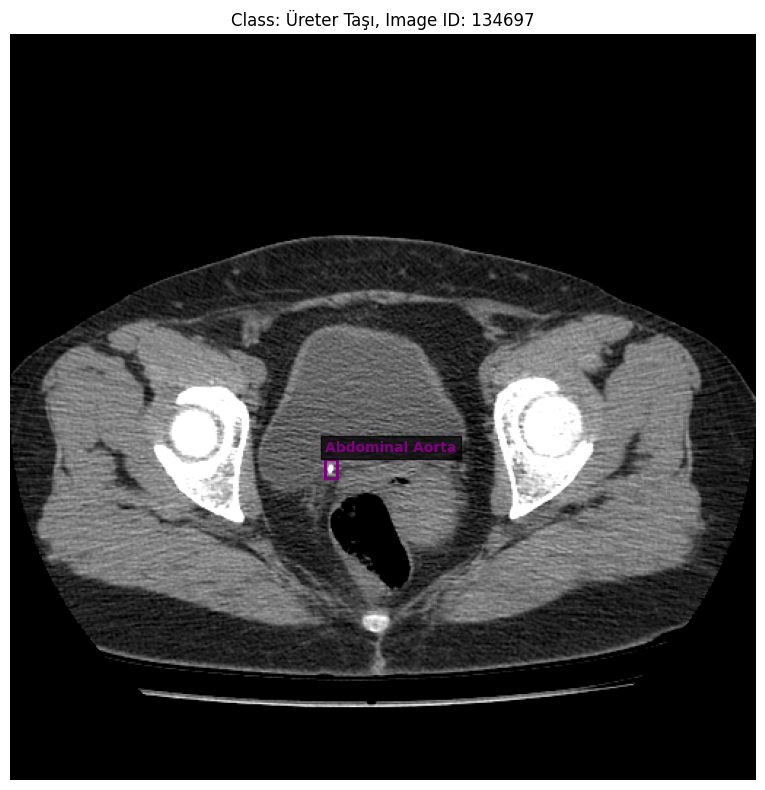

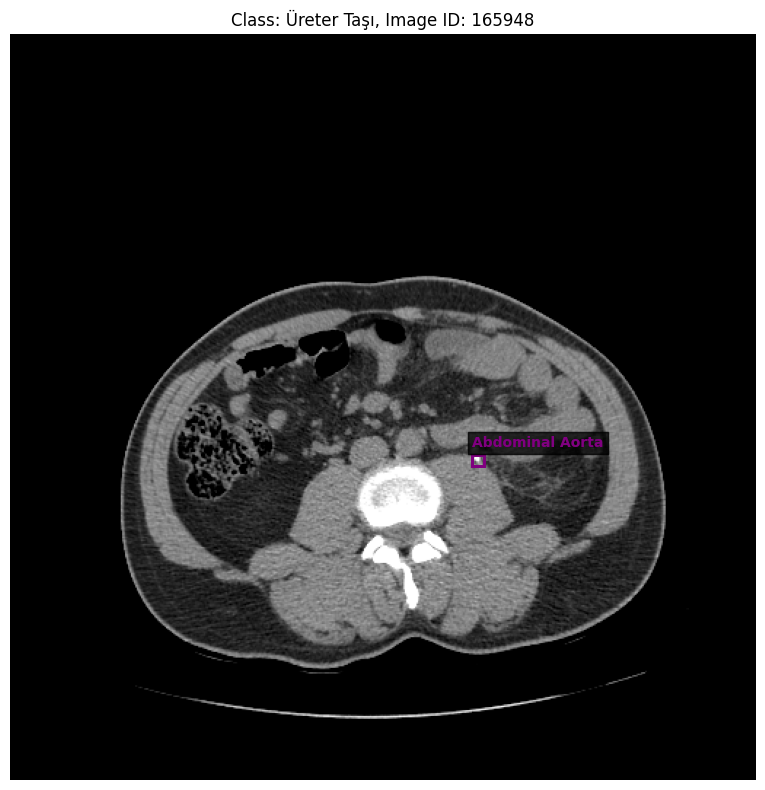

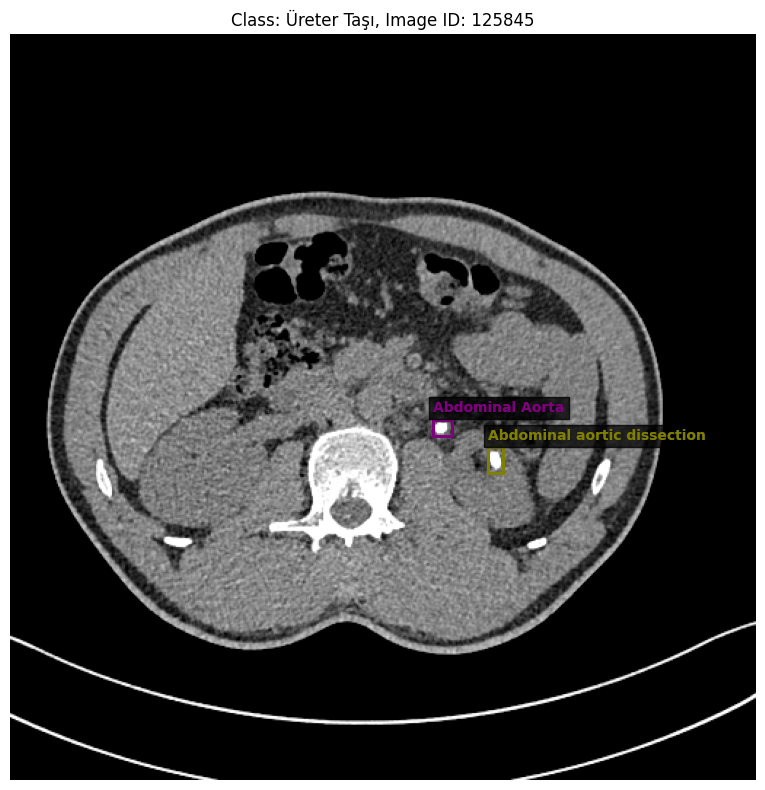

Visualizing examples for class: Kidney stone


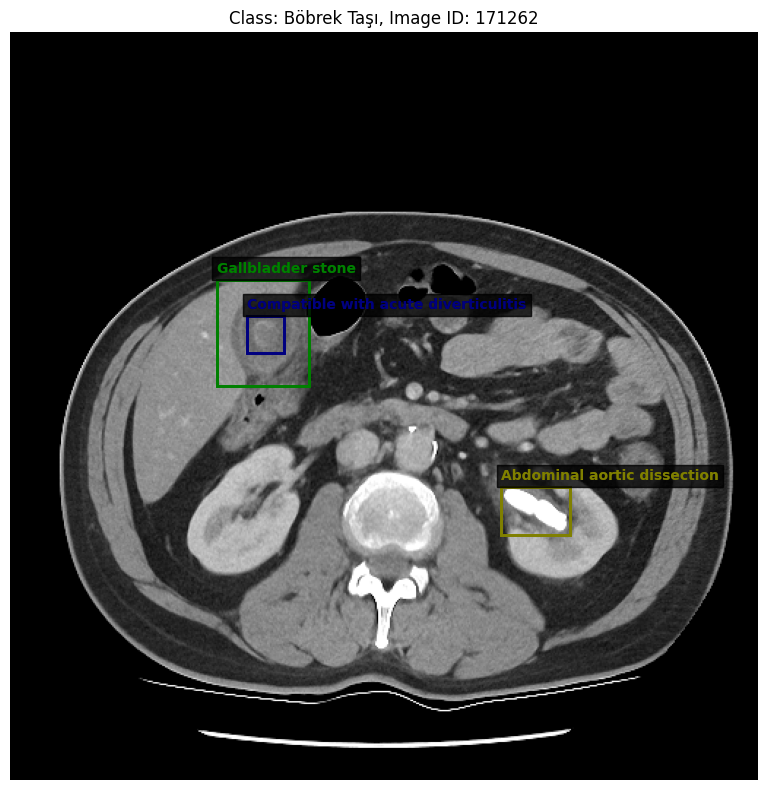

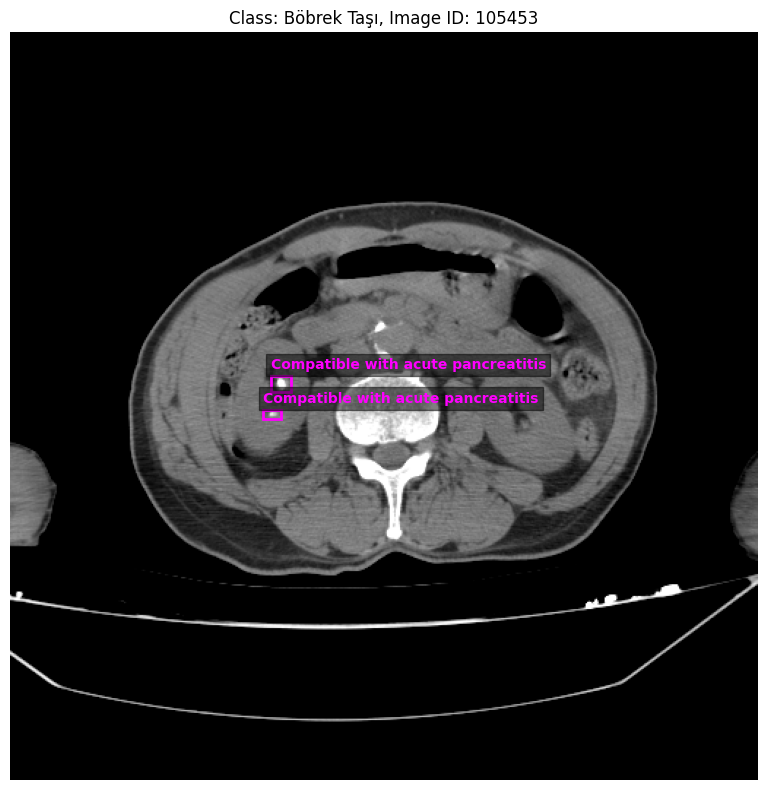

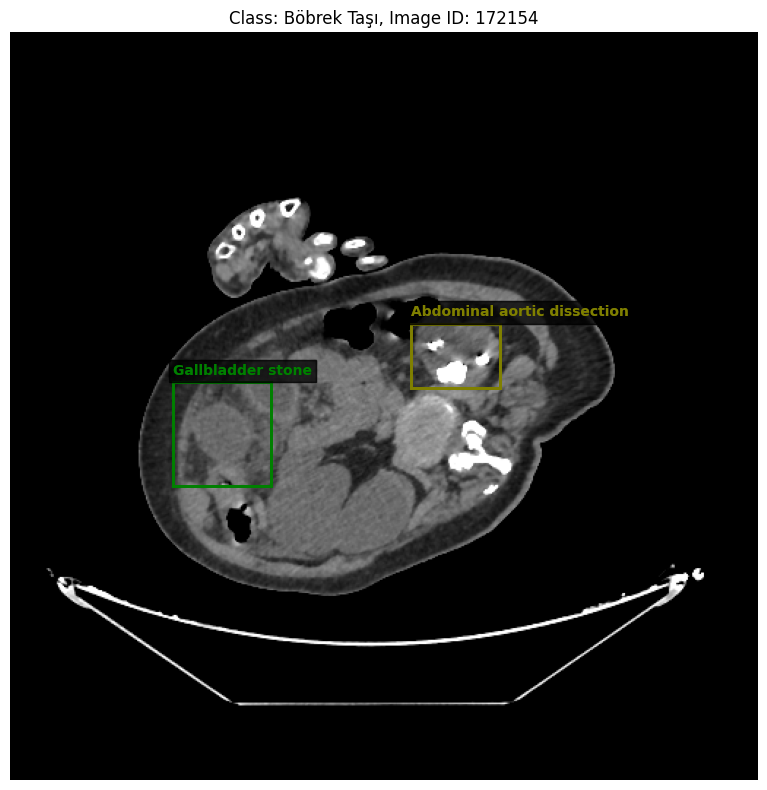

Visualizing examples for class: Abdominal aortic aneurysm


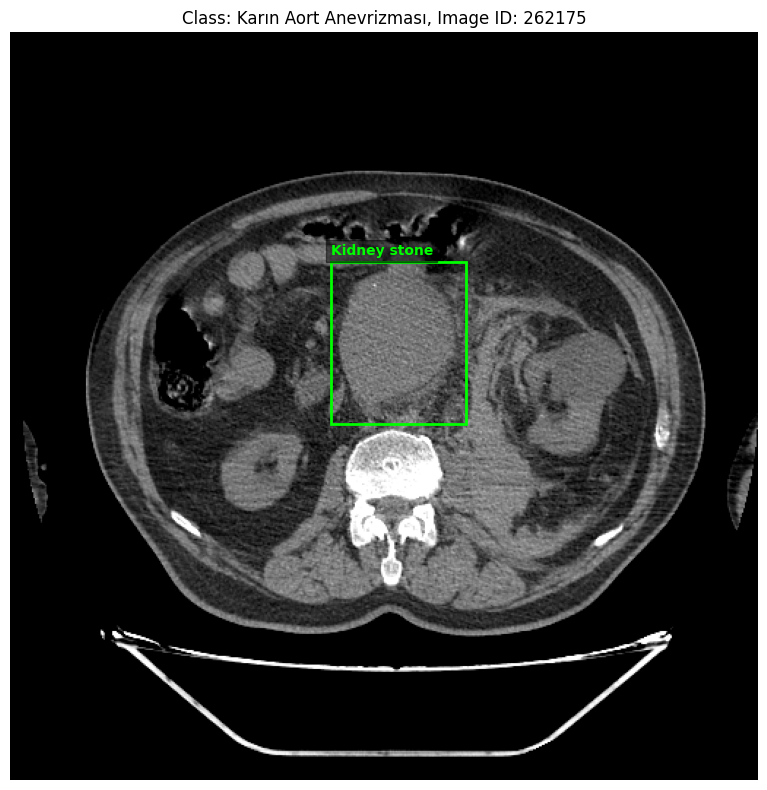

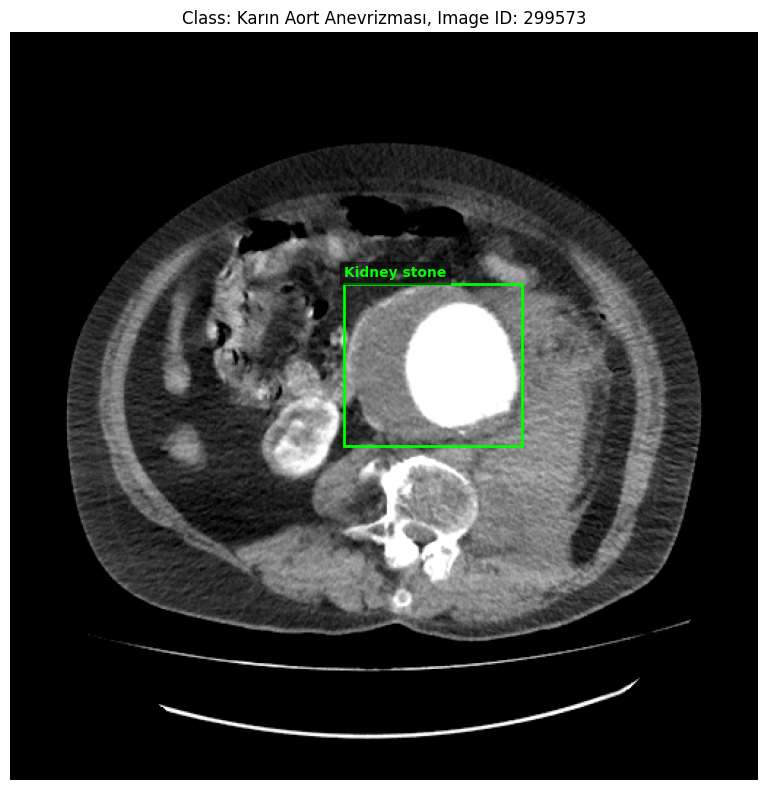

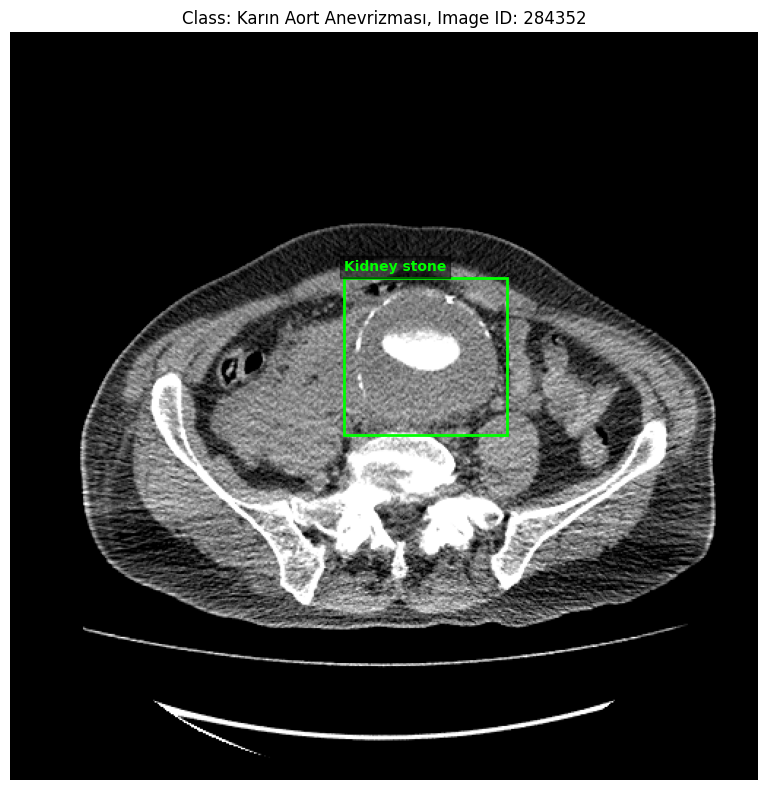

Visualizing examples for class: Compatible with acute cholecystitis


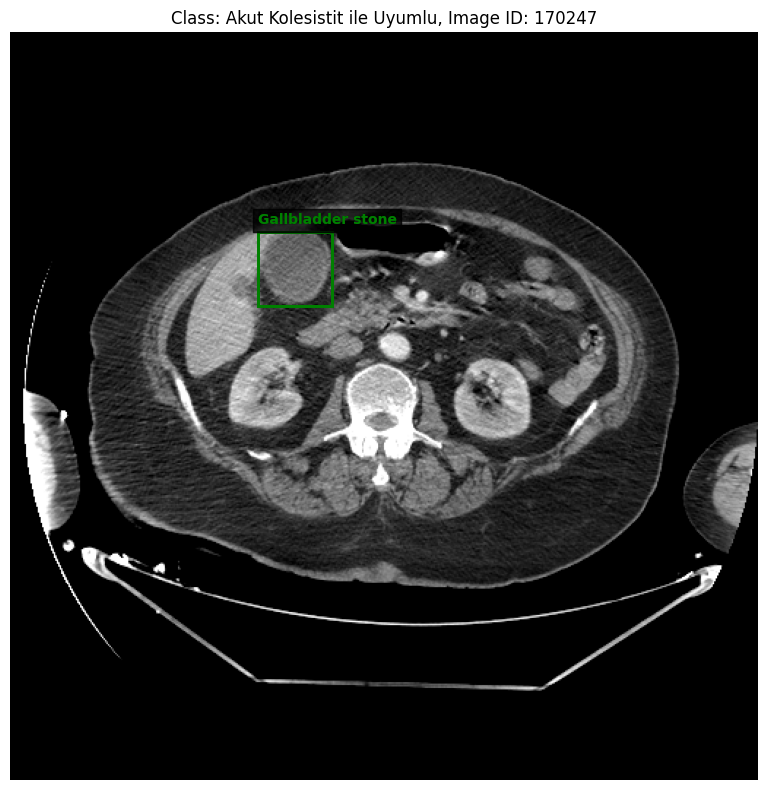

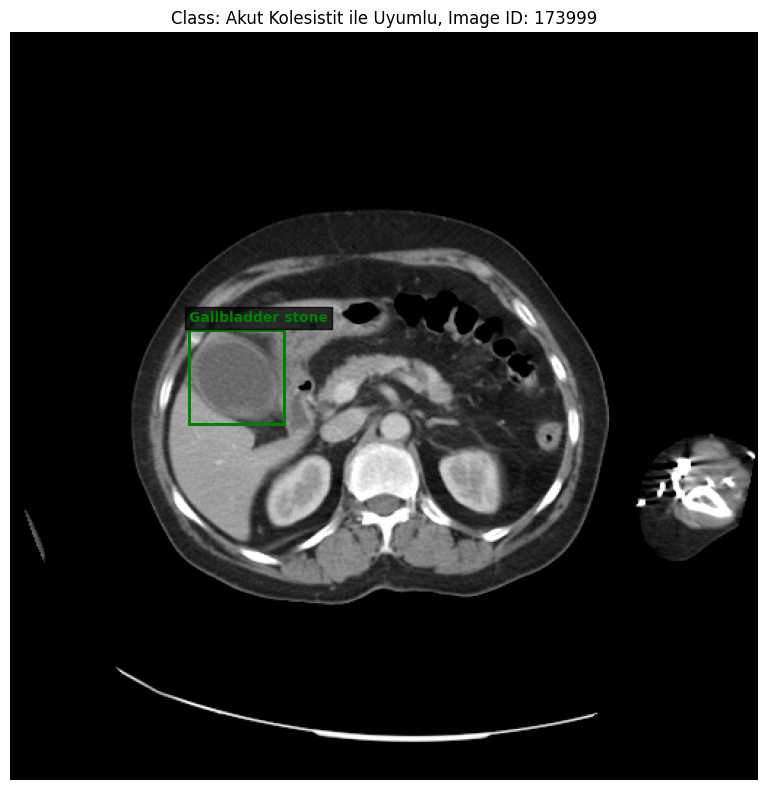

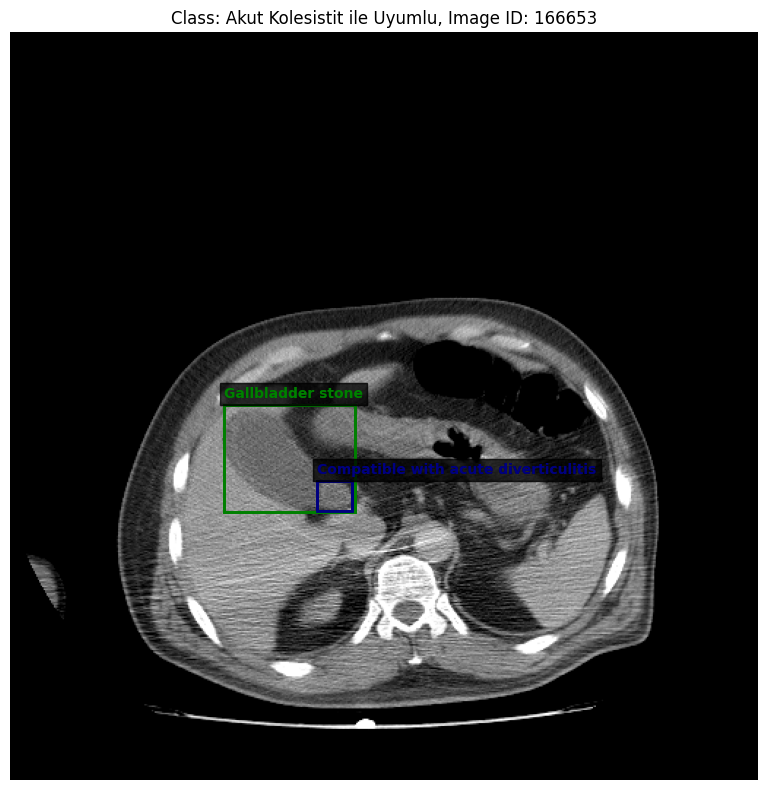

Visualizing examples for class: Compatible with acute pancreatitis


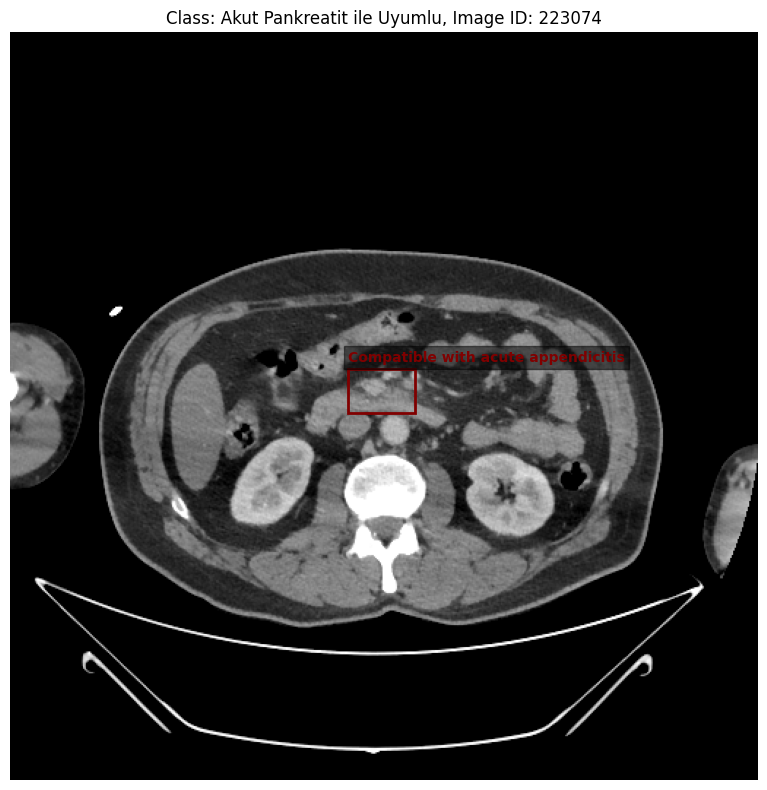

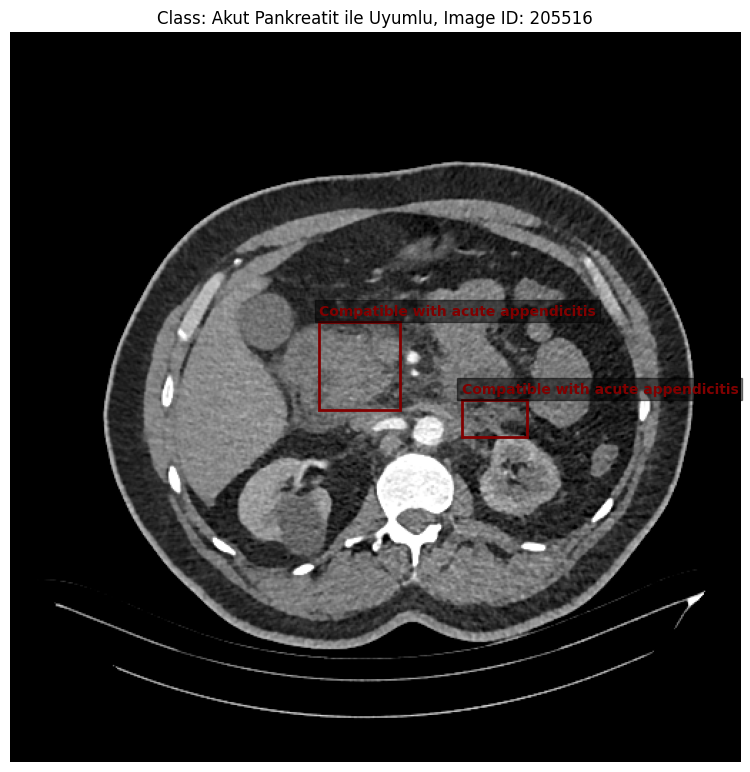

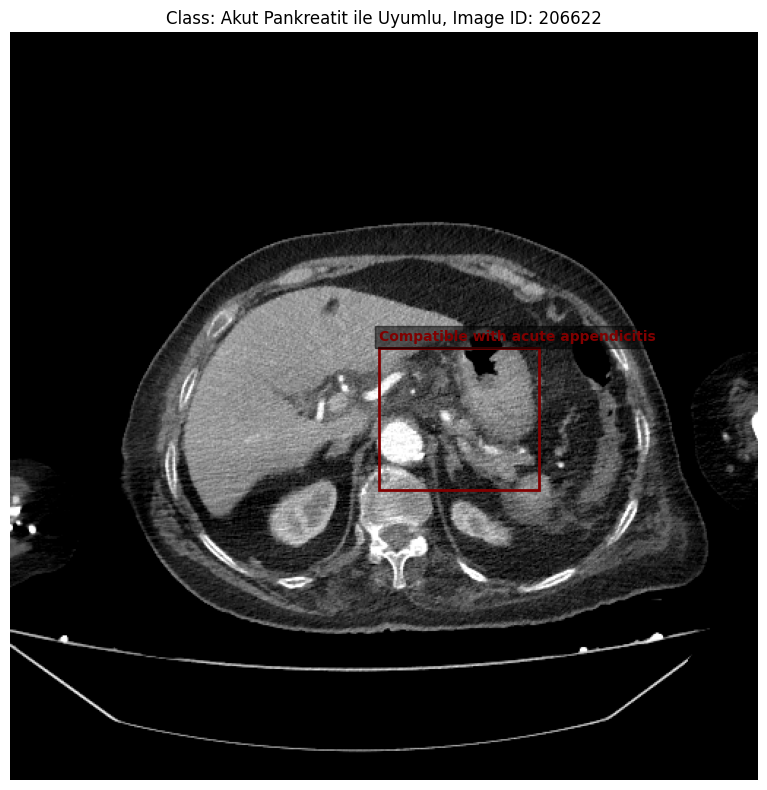

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.font_manager import FontProperties, findSystemFonts

# Her sınıf ismi için benzersiz bir renk atanıyor (BGR formatı - OpenCV için)
# Gerekirse bu renkler değiştirilebilir
CLASS_COLORS = {
    "ureteral stone": (0, 0, 255),  # Kırmızı
    "Kidney stone": (0, 255, 0),    # Yeşil
    "Abdominal aortic aneurysm": (255, 0, 0),  # Mavi
    "Compatible with acute cholecystitis": (255, 255, 0),  # Camgöbeği
    "Compatible with acute pancreatitis": (255, 0, 255),   # Mor–pembe
    "Abdominal Aorta": (128, 0, 128),  # Mor
    "Abdominal aortic dissection": (0, 128, 128),  # Turkuaz
    "Calcified diverticulum": (128, 128, 0),  # Zeytin
    "Compatible with acute appendicitis": (0, 0, 128),  # Lacivert
    "Compatible with acute diverticulitis": (128, 0, 0),  # Bordo
    "Gallbladder stone": (0, 128, 0),  # Koyu yeşil
    # Daha fazla sınıf işlenecekse buraya eklenebilir
}

# Türkçe karakterleri destekleyen bir font bulunmaya çalışılıyor
# Örnek olarak 'DejaVu Sans', 'Arial', 'Liberation Sans', 'Noto Sans' fontları deneniyor
try:
    font_path = findSystemFonts(fontpaths=None, fontext='ttf')
    turkish_font = None
    for font in font_path:
        if 'DejaVuSans' in font or 'Arial' in font or 'LiberationSans' in font or 'NotoSans' in font:
            turkish_font = FontProperties(fname=font)
            break
    if turkish_font is None:
        # Belirli fontlar bulunamazsa varsayılan sans-serif fontlar kullanılır
        plt.rcParams['font.family'] = 'sans-serif'
        plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Arial', 'Liberation Sans', 'Noto Sans', 'sans-serif']
        print("Türkçe karakterler için genel sans-serif font kullanılıyor.")
    else:
        print(f"Türkçe karakterler için kullanılan font: {turkish_font.get_name()}")

except Exception as e:
    print(f"Türkçe font bulunamadı, varsayılan matplotlib fontu kullanılacak. Hata: {e}")
    plt.rcParams.update(plt.rcParamsDefault)


def parse_yolo_label(label_path, img_width, img_height):
    """YOLO formatındaki etiket dosyasını okur ve bounding box'ları piksel koordinatlarına çevirir."""
    bboxes = []
    if not os.path.exists(label_path):
        print(f"Etiket dosyası bulunamadı: {label_path}")
        return bboxes

    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                # YOLO formatı: class_id center_x center_y width height (normalize edilmiş)
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id, center_x, center_y, width, height = map(float, parts)

                    # Piksel koordinatlarına çevrilir (sol-üst ve sağ-alt köşe)
                    x_center = center_x * img_width
                    y_center = center_y * img_height
                    box_width = width * img_width
                    box_height = height * img_height

                    x_min = int(x_center - box_width / 2)
                    y_min = int(y_center - box_height / 2)
                    x_max = int(x_center + box_width / 2)
                    y_max = int(y_center + box_height / 2)

                    # class_id şimdilik doğrudan saklanıyor
                    bboxes.append({'class_id': int(class_id), 'bbox': (x_min, y_min, x_max, y_max)})
                else:
                    print(f"Geçersiz satır atlandı: {line.strip()}")
    except Exception as e:
        print(f"Etiket dosyası ayrıştırılırken hata oluştu: {label_path}, Hata: {e}")
        return []

    return bboxes


# Bounding box ve sınıf adlarını matplotlib ile çizdiren fonksiyon
def draw_bounding_boxes_mpl(image_path, label_path, class_mapping, class_colors):
    """Görüntüyü okur, etiketleri çözümler, matplotlib ile kutuları ve yazıları çizer ve figür döner."""
    img = cv2.imread(image_path)
    if img is None:
        print(f"Hata: Görüntü okunamadı {image_path}")
        return None

    # Matplotlib için BGR -> RGB dönüşümü
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_height, img_width = img_rgb.shape[:2]

    bboxes_data = parse_yolo_label(label_path, img_width, img_height)

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img_rgb)
    ax.set_autoscale_on(False)

    for bbox_info in bboxes_data:
        class_id = bbox_info['class_id']
        x_min, y_min, x_max, y_max = bbox_info['bbox']

        try:
            # Sınıf ismi class_id’ye göre bulunur
            original_class_names = df_valid_files['Class'].unique()
            if class_id < len(original_class_names):
                original_class_name = original_class_names[class_id]
                text = original_class_name
                color_bgr = class_colors.get(original_class_name, (255, 255, 255))
                color_rgb = (color_bgr[2]/255, color_bgr[1]/255, color_bgr[0]/255)
            else:
                text = f"Class ID: {class_id}"
                color_rgb = (1, 1, 1)  # Beyaz

        except IndexError:
            text = f"Class ID: {class_id}"
            color_rgb = (1, 1, 1)
        except Exception:
            text = f"Class ID: {class_id}"
            color_rgb = (1, 1, 1)

        # Dikdörtgen (bounding box) çizimi
        rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                             linewidth=2, edgecolor=color_rgb, facecolor='none')
        ax.add_patch(rect)

        # Sınıf adının kutu üzerine yazılması
        if 'turkish_font' in locals() and turkish_font is not None:
            ax.text(x_min, y_min - 5, text,
                    color=color_rgb, fontsize=10, weight='bold', fontproperties=turkish_font,
                    bbox=dict(facecolor='black', alpha=0.5, pad=3))
        else:
            ax.text(x_min, y_min - 5, text,
                    color=color_rgb, fontsize=10, weight='bold',
                    bbox=dict(facecolor='black', alpha=0.5, pad=3))

    # Başlık Türkçe sınıf adıyla ayarlanıyor
    ax.set_title(f"Sınıf: {class_mapping.get(class_name, class_name)}, Görüntü ID: {row['Image Id']}")
    ax.axis('off')
    plt.tight_layout()

    return fig  # Hazırlanan matplotlib figürü döndürülüyor


# Seçilen örnekler döngüye alınarak çizdiriliyor
for class_name, df_examples in selected_examples.items():
    print(f"Sınıf için görselleştirme: {class_name}")
    for index, row in df_examples.iterrows():
        image_path = row['image_path']
        label_path = row['label_path']

        # Görselleştirme fonksiyonu çağrılır
        fig = draw_bounding_boxes_mpl(image_path, label_path, turkish_classes, CLASS_COLORS)

        if fig is not None:
            plt.show()


YOLOv8 İçin Medikal Görüntü Verisini Hazırlama Scripti (Çok Sınıflı)


In [ ]:
# HÜCRE 1 (ÇOK-SINIFLI TESPİT İÇİN GÜNCELLENDİ): VERİ HAZIRLAMA VE KOPYALAMA

# Gerekli Kütüphaneleri Yükle ve Ortamı Hazırla
import os
import shutil
import random
import yaml
from google.colab import drive
from tqdm import tqdm

# Ultralytics kütüphanesini yükle (sadece ilk çalıştırmada gerekli)
!pip install -q ultralytics

# Google Drive'ı bağla
try:
    drive.mount('/content/drive', force_remount=True)
    print("Google Drive başarıyla bağlandı.")
except Exception as e:
    print(f"Google Drive bağlanırken bir hata oluştu: {e}")

# --- AYARLAR ---
# Hızlı test için kullanılacak dosya sayısı. Tüm veriyi kullanmak için None yapın.
TEST_LIMIT = 100 # veya None

# KAYNAK klasörleriniz (Google Drive'daki)
source_images_dir = "/content/drive/MyDrive/abdomen/prototip/images_png"
source_labels_dir = "/content/drive/MyDrive/abdomen/prototip/labels"

# HEDEF klasörler (Colab'ın geçici hafızasında oluşturulacak)
base_dest_dir = "/content/dataset_abdomen"
# --- BİTİŞ AYARLAR ---

# --- KLASÖR OLUŞTURMA ---
paths = {
    'train_images': os.path.join(base_dest_dir, "images/train"),
    'val_images': os.path.join(base_dest_dir, "images/val"),
    'test_images': os.path.join(base_dest_dir, "images/test"),
    'train_labels': os.path.join(base_dest_dir, "labels/train"),
    'val_labels': os.path.join(base_dest_dir, "labels/val"),
    'test_labels': os.path.join(base_dest_dir, "labels/test"),
}
if os.path.exists(base_dest_dir):
    print(f"'{base_dest_dir}' klasörü temizleniyor...")
    shutil.rmtree(base_dest_dir)
print("Hedef klasörler oluşturuluyor...")
for path in paths.values():
    os.makedirs(path, exist_ok=True)
print("Klasörler oluşturuldu.")

# --- VERİ AYIRMA VE KOPYALAMA ---
print("\nVeri setini ayırma ve kopyalama işlemi başlıyor...")
all_labels = [f for f in os.listdir(source_labels_dir) if f.endswith('.txt')]
random.shuffle(all_labels)

if TEST_LIMIT:
    print(f"UYARI: Hızlı test modu aktif. Sadece ilk {TEST_LIMIT} dosya kullanılacak.")
    all_labels = all_labels[:TEST_LIMIT]

train_ratio, val_ratio = 0.70, 0.15
train_split_idx = int(len(all_labels) * train_ratio)
val_split_idx = train_split_idx + int(len(all_labels) * val_ratio)

train_files = all_labels[:train_split_idx]
val_files = all_labels[train_split_idx:val_split_idx]
test_files = all_labels[val_split_idx:]

print(f"\nToplam dosya sayısı: {len(all_labels)}")
print(f"Eğitim: {len(train_files)}, Doğrulama: {len(val_files)}, Test: {len(test_files)}")

def copy_files(file_list, dest_img_path, dest_label_path):
    copied_count = 0
    for label_filename in tqdm(file_list, desc=f"Kopyalanıyor -> {os.path.basename(dest_img_path)}"):
        basename = os.path.splitext(label_filename)[0]
        try:
            case_number, image_id = basename.split('_', 1)
        except ValueError:
            continue

        src_img_path = os.path.join(source_images_dir, case_number, image_id + '.png')
        src_lbl_path = os.path.join(source_labels_dir, label_filename)

        if os.path.exists(src_img_path):
            dest_image_filename = basename + '.png'
            dest_img_final_path = os.path.join(dest_img_path, dest_image_filename)
            dest_lbl_final_path = os.path.join(dest_label_path, label_filename)
            shutil.copy(src_img_path, dest_img_final_path)
            shutil.copy(src_lbl_path, dest_lbl_final_path)
            copied_count += 1

    print(f"{copied_count}/{len(file_list)} dosya başarıyla kopyalandı.")

copy_files(train_files, paths['train_images'], paths['train_labels'])
copy_files(val_files, paths['val_images'], paths['val_labels'])
copy_files(test_files, paths['test_images'], paths['test_labels'])

print("\nDosya kopyalama işlemi tamamlandı.")

# =========================================================================
# === GÜNCELLENMİŞ YAML DOSYASI OLUŞTURMA BÖLÜMÜ                         ===
# =========================================================================
print("\ndata.yaml dosyası oluşturuluyor...")

# Projenin amacına uygun olarak 11 sınıfın tamamını tanımla
class_names = [
    "Abdominal aortic aneurysm",
    "Compatible with acute pancreatitis",
    "Compatible with acute cholecystitis",
    "Gallbladder stone",
    "Kidney stone",
    "Abdominal aortic dissection",
    "ureteral stone",
    "Compatible with acute appendicitis",
    "Calcified diverticulum",
    "Compatible with acute diverticulitis",
    "Abdominal Aorta"
]

data_yaml_content = {
    'path': base_dest_dir,
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': len(class_names),  # Sınıf sayısı artık 11 olacak
    'names': class_names    # Sınıf isimlerinin tam listesi
}
yaml_path = '/content/data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)
print(f"data.yaml dosyası başarıyla '{yaml_path}' olarak oluşturuldu.")
print(f"Toplam {len(class_names)} sınıf tanımlandı.")
# =========================================================================
# === GÜNCELLEME SONU                                                   ===
# =========================================================================

print("\n#####################################################")
print("### VERİ HAZIRLIĞI TAMAMLANDI. EĞİTİM İÇİN HAZIR! ###")
print("#####################################################")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 101.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 664.8/664.8 MB 203.2 MB/s eta 0:00:01
ERROR: Operation cancelled by user
Mounted at /content/drive
Google Drive başarıyla bağlandı.
Hedef klasörler oluşturuluyor...
Klasörler oluşturuldu.

Veri setini ayırma ve kopyalama işlemi başlıyor...
UYARI: Hızlı test modu aktif. Sadece ilk 100 dosya kullanılacak.

Toplam dosya sayısı: 100
Eğitim: 70, Doğrulama: 15, Test: 15


Kopyalanıyor -> train: 100%|██████████| 70/70 [02:51<00:00,  2.45s/it]


70/70 dosya başarıyla kopyalandı.


Kopyalanıyor -> val: 100%|██████████| 15/15 [00:46<00:00,  3.07s/it]


15/15 dosya başarıyla kopyalandı.


Kopyalanıyor -> test: 100%|██████████| 15/15 [00:26<00:00,  1.76s/it]

15/15 dosya başarıyla kopyalandı.

Dosya kopyalama işlemi tamamlandı.

data.yaml dosyası oluşturuluyor...
data.yaml dosyası başarıyla '/content/data.yaml' olarak oluşturuldu.
Toplam 11 sınıf tanımlandı.

#####################################################
### VERİ HAZIRLIĞI TAMAMLANDI. EĞİTİM İÇİN HAZIR! ###
#####################################################


YOLOv8 İçin DÜZENLİ VERİ SETİ OLUŞTURMA ve GOOGLE DRIVE’A KALICI KAYDETME


In [ ]:
# KOD: KAYNAK VERİYİ DÜZENLEYİP DRIVE'A KALICI OLARAK KAYDETME

# Gerekli Kütüphaneleri Yükle ve Ortamı Hazırla
import os
import shutil
import random
import yaml
from google.colab import drive
from tqdm import tqdm

# Google Drive'ı bağla
try:
    drive.mount('/content/drive', force_remount=True)
    print("Google Drive başarıyla bağlandı.")
except Exception as e:
    print(f"Google Drive bağlanırken bir hata oluştu: {e}")

# --- AYARLAR ---
# 1. KAYNAK: Dağınık yapıdaki orijinal verilerinizin yolları
source_images_dir = "/content/drive/MyDrive/abdomen/prototip/images_png"
source_labels_dir = "/content/drive/MyDrive/abdomen/prototip/labels"

# 2. HEDEF: Hazırlanmış ve düzenlenmiş veri setinin Drive'da kalıcı olarak saklanacağı yer
# BU YOLU DEĞİŞTİREBİLİRSİNİZ. KLASÖR YOKSA OTOMATİK OLUŞTURULACAKTIR.
drive_dest_dir = "/content/drive/MyDrive/abdomen/YOLO_hazir_dataset"

# 3. GEÇİCİ ÇALIŞMA ALANI: Colab'da dosyaları işlemek için kullanılacak geçici klasör
temp_work_dir = "/content/dataset_processing"
# --- BİTİŞ AYARLAR ---

# --- ÖNCEKİ HAZIRLIKLARI TEMİZLEME (İsteğe bağlı ama önerilir) ---
# Eğer hedef klasör Drive'da zaten varsa, tekrar oluşturulmasını önlemek için sil
if os.path.exists(drive_dest_dir):
    print(f"UYARI: Hedef klasör '{drive_dest_dir}' Drive'da zaten mevcut. İçeriği siliniyor...")
    shutil.rmtree(drive_dest_dir)
# Colab'daki geçici klasörü temizle
if os.path.exists(temp_work_dir):
    shutil.rmtree(temp_work_dir)
print("Eski hazırlıklar temizlendi.")


# --- KLASÖR YAPISINI OLUŞTURMA (Önce geçici alanda) ---
paths = {
    'train_images': os.path.join(temp_work_dir, "images/train"),
    'val_images': os.path.join(temp_work_dir, "images/val"),
    'test_images': os.path.join(temp_work_dir, "images/test"),
    'train_labels': os.path.join(temp_work_dir, "labels/train"),
    'val_labels': os.path.join(temp_work_dir, "labels/val"),
    'test_labels': os.path.join(temp_work_dir, "labels/test"),
}
print("Geçici çalışma klasörleri oluşturuluyor...")
for path in paths.values():
    os.makedirs(path, exist_ok=True)
print("Klasörler oluşturuldu.")


# --- VERİ AYIRMA VE GEÇİCİ ALANA KOPYALAMA ---
print("\nTüm veriler ayırma ve kopyalama için hazırlanıyor...")
all_labels = [f for f in os.listdir(source_labels_dir) if f.endswith('.txt')]
random.shuffle(all_labels)

train_ratio, val_ratio = 0.70, 0.15
train_split_idx = int(len(all_labels) * train_ratio)
val_split_idx = train_split_idx + int(len(all_labels) * val_ratio)

train_files = all_labels[:train_split_idx]
val_files = all_labels[train_split_idx:val_split_idx]
test_files = all_labels[val_split_idx:]

print(f"\nToplam dosya sayısı: {len(all_labels)}")
print(f"Eğitim: {len(train_files)}, Doğrulama: {len(val_files)}, Test: {len(test_files)}")

def copy_files_to_temp(file_list, dest_img_path, dest_label_path):
    for label_filename in tqdm(file_list, desc=f"İşleniyor -> {os.path.basename(dest_img_path)}"):
        basename = os.path.splitext(label_filename)[0]
        try:
            case_number, image_id = basename.split('_', 1)
        except ValueError: continue
        src_img_path = os.path.join(source_images_dir, case_number, image_id + '.png')
        src_lbl_path = os.path.join(source_labels_dir, label_filename)
        if os.path.exists(src_img_path):
            dest_img_final_path = os.path.join(dest_img_path, basename + '.png')
            dest_lbl_final_path = os.path.join(dest_label_path, label_filename)
            shutil.copy(src_img_path, dest_img_final_path)
            shutil.copy(src_lbl_path, dest_lbl_final_path)

copy_files_to_temp(train_files, paths['train_images'], paths['train_labels'])
copy_files_to_temp(val_files, paths['val_images'], paths['val_labels'])
copy_files_to_temp(test_files, paths['test_images'], paths['test_labels'])

print("\nTüm dosyalar geçici alanda başarıyla düzenlendi.")


# --- YAML DOSYASINI OLUŞTURMA (Geçici alana) ---
print("\ndata.yaml dosyası oluşturuluyor...")
class_names = [
    "Abdominal aortic aneurysm", "Compatible with acute pancreatitis",
    "Compatible with acute cholecystitis", "Gallbladder stone", "Kidney stone",
    "Abdominal aortic dissection", "ureteral stone",
    "Compatible with acute appendicitis", "Calcified diverticulum",
    "Compatible with acute diverticulitis", "Abdominal Aorta"
]
data_yaml_content = {
    'path': '../', # YOLO, yaml dosyasına göre göreceli yol kullanır.
    'train': 'images/train',
    'val': 'images/val',
    'test': 'images/test',
    'nc': len(class_names),
    'names': class_names
}
yaml_file_path = os.path.join(temp_work_dir, "data.yaml")
with open(yaml_file_path, 'w') as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)
print("YAML dosyası oluşturuldu.")


# --- SON ADIM: HAZIRLANAN VERİ SETİNİ GOOGLE DRIVE'A KOPYALAMA ---
print(f"\nHazırlanan veri seti '{temp_work_dir}' adresinden '{drive_dest_dir}' adresine kopyalanıyor...")
print("Bu işlem veri setinin boyutuna göre zaman alabilir.")

try:
    shutil.copytree(temp_work_dir, drive_dest_dir)
    print("\n#####################################################################")
    print("### BAŞARILI! Veri setiniz düzenlendi ve Drive'a kalıcı olarak kaydedildi. ###")
    print(f"### Kayıt Yeri: {drive_dest_dir} ###")
    print("#####################################################################")
except Exception as e:
    print(f"Kopyalama sırasında bir hata oluştu: {e}")

Mounted at /content/drive
Google Drive başarıyla bağlandı.
Eski hazırlıklar temizlendi.
Geçici çalışma klasörleri oluşturuluyor...
Klasörler oluşturuldu.

Tüm veriler ayırma ve kopyalama için hazırlanıyor...

Toplam dosya sayısı: 22496
Eğitim: 15747, Doğrulama: 3374, Test: 3375


İşleniyor -> test: 100%|██████████| 3375/3375 [22:33<00:00,  2.49it/s]



Tüm dosyalar geçici alanda başarıyla düzenlendi.

data.yaml dosyası oluşturuluyor...
YAML dosyası oluşturuldu.

Hazırlanan veri seti '/content/dataset_processing' adresinden '/content/drive/MyDrive/abdomen/YOLO_hazir_dataset' adresine kopyalanıyor...
Bu işlem veri setinin boyutuna göre zaman alabilir.

#####################################################################
### BAŞARILI! Veri setiniz düzenlendi ve Drive'a kalıcı olarak kaydedildi. ###
### Kayıt Yeri: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset ###
#####################################################################


YOLOv9 Eğitim Scripti


In [ ]:

# Gerekli kütüphaneleri içe aktar
# Ultralytics kütüphanesini yükle
!pip install -q ultralytics
from ultralytics import YOLO
import os
import shutil # shutil kütüphanesini ekledik

# --- AYARLAR ---
# Eğitim için kullanılacak YAML dosyasının yolu.
# Bu dosya, veri hazırlığı adımında Google Drive'a kaydedildi.
DATA_YAML_PATH = '/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/data.yaml' # BU YOLU KONTROL EDİN VE GEREKİRSE GÜNCELLEYİN!

# Kullanılacak YOLO modeli: 'yolov9c.pt' (COCO üzerinde eğitilmiş) veya 'yolov9e.pt' vb.
# Ultralytics belgelerinden uygun modeli seçin.
MODEL_NAME = 'yolov9c.pt'

# Eğitim parametreleri
EPOCHS = 100      # Eğitim turu sayısı (İhtiyaca göre artırılabilir)
BATCH_SIZE = 16   # Batch boyutu (GPU belleğine göre ayarlayın, yetmiyorsa düşürün)
IMAGE_SIZE = 640  # Görüntü boyutu (Modelin gereksinimine veya isteğinize göre ayarlayın)
PROJECT_NAME = 'yolov9_abdomen_training' # Eğitim sonuçlarının kaydedileceği klasör adı

# --- EĞİTİM ---
print(f"\nYOLOv9 Eğitimi Başlıyor: Model={MODEL_NAME}, Epochs={EPOCHS}, Batch Size={BATCH_SIZE}, Image Size={IMAGE_SIZE}")
print(f"Kullanılan veri YAML dosyası: {DATA_YAML_PATH}")

# YAML dosyasının varlığını kontrol et
if not os.path.exists(DATA_YAML_PATH):
    print(f"HATA: Belirtilen YAML dosyası bulunamadı: {DATA_YAML_PATH}")
    print("Lütfen 'DATA_YAML_PATH' değişkenindeki yolu kontrol edin ve veri hazırlığı adımını başarıyla tamamladığınızdan emin olun.")
else:
    try:
        # YOLO modelini yükle
        model = YOLO(MODEL_NAME)
        print(f"{MODEL_NAME} modeli başarıyla yüklendi.")

        # Modeli eğitin
        results = model.train(
            data=DATA_YAML_PATH,
            epochs=EPOCHS,
            imgsz=IMAGE_SIZE,
            batch=BATCH_SIZE,
            name=PROJECT_NAME,
            # Diğer eğitim parametreleri eklenebilir (örn: lr, momentum, weight_decay vb.)
        )

        print("\nYOLOv9 Eğitimi Başarıyla Tamamlandı!")
        print(f"Sonuçlar 'runs/detect/{PROJECT_NAME}' klasörüne kaydedildi.")

        # İsteğe bağlı: Eğitilmiş en iyi modeli Google Drive'a kopyala
        print("\nEğitilmiş en iyi model ağırlığı Google Drive'a kopyalanıyor...")
        best_model_path_colab = os.path.join('/content/runs/detect/', PROJECT_NAME, 'weights/best.pt')
        drive_save_dir = '/content/drive/MyDrive/abdomen/trained_models' # Modelin Drive'da kaydedileceği dizin
        os.makedirs(drive_save_dir, exist_ok=True)
        final_model_name = f'{os.path.splitext(MODEL_NAME)[0]}_{PROJECT_NAME}_best_{EPOCHS}epochs.pt'
        drive_final_model_path = os.path.join(drive_save_dir, final_model_name)

        if os.path.exists(best_model_path_colab):
            shutil.copy(best_model_path_colab, drive_final_model_path)
            print(f"En iyi model ağırlığı başarıyla kaydedildi: {drive_final_model_path}")
        else:
            print("HATA: Eğitim sonrası 'best.pt' modeli bulunamadı. Kopyalama yapılamadı.")

    except Exception as e:
        print(f"\nEğitim sırasında bir hata oluştu: {e}")
        print("Lütfen ayarlarınızı (MODEL_NAME, BATCH_SIZE vb.) ve çalışma zamanı türünüzü (GPU) kontrol edin.")


YOLOv9 Eğitimi Başlıyor: Model=yolov9c.pt, Epochs=100, Batch Size=16, Image Size=640
Kullanılan veri YAML dosyası: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/data.yaml
yolov9c.pt modeli başarıyla yüklendi.
Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, 

100%|██████████| 755k/755k [00:00<00:00, 78.0MB/s]

Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       


  7                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  8                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  9                  -1  1    656896  ultralytics.nn.modules.block.SPPELAN         [512, 512, 256]               
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1   3119616  ultralytics.nn.modules.block.RepNCSPELAN4    [1024, 512, 512, 256, 1]      
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1    912640  ultralytics.nn.modules.block.RepNCSPELAN4    [1024

100%|██████████| 5.35M/5.35M [00:00<00:00, 310MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.4±0.1 ms, read: 0.1±0.0 MB/s, size: 78.8 KB)


train: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/train... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [35:34<00:00,  7.38it/s]

train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_1143

train: New cache created: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 2.9±5.1 ms, read: 0.1±0.0 MB/s, size: 81.9 KB)


val: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/val... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [07:29<00:00,  7.50it/s]

val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
v

val: New cache created: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/val.cache
Plotting labels to runs/detect/yolov9_abdomen_training6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolov9_abdomen_training6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.2G      1.433      2.046      1.479          9        640: 100%|██████████| 985/985 [03:41<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.61it/s]


                   all       3374       3719      0.401      0.315      0.309      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      11.8G      1.354      1.124      1.345          3        640: 100%|██████████| 985/985 [03:26<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.82it/s]

                   all       3374       3719       0.42      0.411      0.361       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      11.8G      1.417      1.175      1.406          3        640: 100%|██████████| 985/985 [03:19<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]


                   all       3374       3719      0.457      0.364      0.334      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.9G      1.443      1.188      1.429          5        640: 100%|██████████| 985/985 [03:19<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.80it/s]

                   all       3374       3719      0.428      0.375      0.328      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      11.9G      1.383      1.065      1.385          4        640: 100%|██████████| 985/985 [03:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.571      0.373      0.397      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        12G      1.337     0.9863      1.357          7        640: 100%|██████████| 985/985 [03:17<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.668      0.397      0.428      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100        12G      1.311     0.9415       1.34          7        640: 100%|██████████| 985/985 [03:17<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.772      0.459      0.486      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.5G      1.263     0.8697       1.31          8        640: 100%|██████████| 985/985 [03:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.672      0.477      0.522      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      12.6G      1.246      0.848        1.3          5        640: 100%|██████████| 985/985 [03:19<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.759      0.503      0.561      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      12.6G      1.221     0.8118      1.276          6        640: 100%|██████████| 985/985 [03:18<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.82it/s]

                   all       3374       3719       0.75      0.584      0.586      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      12.7G      1.197      0.784      1.264          9        640: 100%|██████████| 985/985 [03:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.682       0.52      0.581      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.7G      1.181     0.7651      1.245          4        640: 100%|██████████| 985/985 [03:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.815      0.536      0.646      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      12.8G      1.161     0.7327      1.246          4        640: 100%|██████████| 985/985 [03:19<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.783        0.6      0.658      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      12.8G      1.145     0.7101      1.232          5        640: 100%|██████████| 985/985 [03:19<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.77it/s]

                   all       3374       3719      0.772      0.594      0.715      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      12.9G      1.127     0.6938      1.218          3        640: 100%|██████████| 985/985 [03:19<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.842       0.53       0.68      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      12.9G      1.123     0.6798      1.209          7        640: 100%|██████████| 985/985 [03:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.854      0.709      0.821      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100        13G      1.102     0.6631      1.205          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.656      0.732      0.758      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100        13G      1.088     0.6428      1.193          9        640: 100%|██████████| 985/985 [03:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.749      0.688      0.817      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      13.1G       1.08     0.6351      1.185          3        640: 100%|██████████| 985/985 [03:20<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.79it/s]

                   all       3374       3719      0.801      0.794      0.848      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      13.1G      1.068     0.6192      1.176          4        640: 100%|██████████| 985/985 [03:19<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.75it/s]

                   all       3374       3719      0.824      0.695      0.793      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.2G       1.05     0.6051      1.164          3        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.826      0.769      0.817      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      13.2G      1.037     0.5924      1.156          7        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.87it/s]

                   all       3374       3719      0.786      0.767      0.824      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      13.3G      1.029     0.5842      1.161          4        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.80it/s]

                   all       3374       3719      0.872      0.749      0.822      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      13.7G      1.028     0.5735      1.162         11        640: 100%|██████████| 985/985 [03:20<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.752      0.818      0.838      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      13.8G      1.011     0.5646       1.14          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.793      0.751       0.79       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      13.8G      1.008     0.5571      1.143          7        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.793      0.813      0.843      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.9G      1.002     0.5531      1.142          7        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.75it/s]

                   all       3374       3719      0.809      0.824      0.859      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      13.9G     0.9907     0.5436      1.139          6        640: 100%|██████████| 985/985 [03:19<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.89it/s]

                   all       3374       3719      0.863      0.815      0.871      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100        14G     0.9817     0.5364      1.132          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.794      0.828      0.857      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100        14G     0.9806      0.532      1.118          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.77it/s]

                   all       3374       3719      0.812      0.816      0.856      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      14.1G     0.9715     0.5212       1.12          1        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.897      0.819       0.88      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      14.1G     0.9644     0.5205      1.108          3        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.77it/s]

                   all       3374       3719      0.878      0.816      0.887      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      14.2G     0.9541     0.5077      1.099          8        640: 100%|██████████| 985/985 [03:22<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.791      0.838      0.893      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      14.2G      0.945     0.4972      1.102          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.77it/s]

                   all       3374       3719      0.889      0.791      0.872      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      14.6G     0.9385     0.4952      1.097          6        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.899      0.782      0.876      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      14.6G      0.929     0.4861      1.086          5        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.75it/s]

                   all       3374       3719      0.901      0.769       0.87      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      14.7G     0.9261      0.487       1.09          3        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.878      0.831      0.891      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      14.7G     0.9208     0.4836      1.085         10        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.76it/s]

                   all       3374       3719      0.908      0.811      0.906       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      14.8G     0.9126     0.4779      1.077          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.917      0.825      0.888        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      14.8G     0.9065     0.4681      1.076          4        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.897      0.844      0.895      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      14.9G     0.9054     0.4699      1.075          7        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.82it/s]

                   all       3374       3719      0.885      0.838      0.906      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      14.9G     0.8922     0.4604      1.065          4        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.80it/s]

                   all       3374       3719      0.883      0.854      0.912      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100        15G     0.8846     0.4516      1.063          6        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.86it/s]

                   all       3374       3719      0.899      0.878      0.918      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100        15G     0.8826      0.452      1.054          6        640: 100%|██████████| 985/985 [03:22<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.922      0.861       0.92      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      15.7G     0.8743     0.4454      1.052          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.79it/s]

                   all       3374       3719      0.902      0.873      0.916      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      15.7G     0.8722     0.4379      1.058          5        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.80it/s]

                   all       3374       3719      0.898      0.879      0.919      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      15.8G     0.8614      0.434      1.052          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.908      0.866       0.92      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      15.8G     0.8543      0.428      1.045          3        640: 100%|██████████| 985/985 [03:22<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.884       0.89      0.922       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      15.9G      0.853     0.4307      1.054          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.76it/s]

                   all       3374       3719      0.889      0.886      0.925      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      15.9G     0.8485     0.4228      1.043          4        640: 100%|██████████| 985/985 [03:22<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.912      0.887      0.925      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100        16G     0.8497     0.4242      1.039          6        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.75it/s]

                   all       3374       3719      0.903      0.878      0.924      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100        16G     0.8348     0.4177      1.031          9        640: 100%|██████████| 985/985 [03:22<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.78it/s]

                   all       3374       3719      0.906      0.884      0.926      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      16.1G     0.8392     0.4174      1.044          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.79it/s]

                   all       3374       3719      0.911      0.884      0.923      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      16.1G     0.8293      0.411       1.03          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.92it/s]

                   all       3374       3719      0.914      0.873      0.922      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      16.2G     0.8227      0.405       1.02          5        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.91it/s]

                   all       3374       3719      0.917      0.874      0.926      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      16.7G     0.8181     0.4032      1.026          1        640: 100%|██████████| 985/985 [03:19<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.88it/s]

                   all       3374       3719      0.921      0.875      0.926      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      16.7G     0.8104     0.3981      1.021          3        640: 100%|██████████| 985/985 [03:19<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719      0.923      0.879      0.927      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      16.7G     0.8095     0.3956       1.02          7        640: 100%|██████████| 985/985 [03:20<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.91it/s]

                   all       3374       3719      0.919      0.882      0.928      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      16.8G     0.8052      0.395      1.013          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.921       0.88      0.927      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      17.3G     0.7993     0.3897       1.02         10        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.88it/s]

                   all       3374       3719      0.911      0.886       0.93      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      17.3G     0.7914     0.3843      1.008          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.79it/s]

                   all       3374       3719      0.909      0.886       0.93      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      17.4G     0.7871     0.3829     0.9999          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.92it/s]

                   all       3374       3719      0.914      0.887      0.931      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      17.4G     0.7819     0.3764     0.9981          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.914      0.886      0.931      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      17.5G     0.7677     0.3704     0.9928          4        640: 100%|██████████| 985/985 [03:20<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.911      0.889      0.931      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      17.5G     0.7679     0.3746     0.9938          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.76it/s]

                   all       3374       3719       0.91      0.892      0.931      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      17.6G     0.7651     0.3738      1.006          5        640: 100%|██████████| 985/985 [03:20<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719      0.915      0.891      0.932      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      17.6G     0.7639     0.3681      1.002          6        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.915      0.892      0.932      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      18.1G     0.7537     0.3636     0.9938          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719      0.919       0.89      0.932      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      18.2G     0.7426     0.3582     0.9809          6        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.917       0.89       0.93      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      18.2G     0.7446     0.3561      0.987          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.87it/s]

                   all       3374       3719      0.916       0.89       0.93      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      18.3G     0.7437     0.3535     0.9925          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.916      0.889      0.931       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      18.3G     0.7301     0.3497     0.9895          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.86it/s]

                   all       3374       3719       0.92      0.887      0.932      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      18.4G     0.7302     0.3483     0.9902          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.917      0.892      0.932      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      18.4G     0.7231     0.3448     0.9811          1        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.86it/s]

                   all       3374       3719      0.919       0.89      0.932      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      18.5G      0.716      0.341     0.9738          8        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.82it/s]

                   all       3374       3719       0.92      0.889      0.932      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100        19G     0.7084     0.3366     0.9697          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.88it/s]

                   all       3374       3719      0.919       0.89      0.933      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100        19G     0.7064     0.3374     0.9705          8        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.919      0.889      0.932      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100        19G     0.6986     0.3334     0.9626          2        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.918      0.892      0.932       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      19.1G     0.6983     0.3317     0.9682          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:22<00:00,  4.81it/s]

                   all       3374       3719      0.917      0.891      0.932      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      19.2G     0.6856     0.3249     0.9609          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.87it/s]

                   all       3374       3719      0.917      0.891      0.932       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      19.2G     0.6822     0.3211     0.9563          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.917      0.891      0.932      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      19.2G      0.684     0.3212     0.9627          5        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.86it/s]

                   all       3374       3719      0.917      0.895      0.932       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      19.3G     0.6774     0.3219     0.9639          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.916      0.895      0.933       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      19.8G     0.6662     0.3121     0.9525          8        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.87it/s]

                   all       3374       3719      0.916      0.896      0.933      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.9G     0.6669     0.3112     0.9562          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.922       0.89      0.933      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.9G     0.6582     0.3087     0.9525          6        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719      0.921       0.89      0.934      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.9G     0.6504     0.3042     0.9472          5        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.922      0.891      0.933      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.9G     0.6452     0.3003     0.9441          6        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.88it/s]

                   all       3374       3719      0.922      0.891      0.933      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.9G      0.642        0.3     0.9514          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.922       0.89      0.933      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.9G     0.6369     0.2973     0.9438          8        640: 100%|██████████| 985/985 [03:21<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.87it/s]

                   all       3374       3719      0.925      0.892      0.933      0.636


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.9G     0.5758     0.2352     0.9044          3        640: 100%|██████████| 985/985 [03:22<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.86it/s]

                   all       3374       3719      0.926       0.89      0.933      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.9G     0.5575     0.2312     0.9009          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.929      0.893      0.933      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.9G     0.5503     0.2273     0.8944          4        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.83it/s]

                   all       3374       3719      0.931      0.893      0.933      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.9G     0.5414      0.223     0.8875          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.932      0.892      0.934      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.9G     0.5319     0.2181     0.8817          4        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.85it/s]

                   all       3374       3719      0.932      0.893      0.935      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100        12G     0.5287     0.2174     0.8789          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.933      0.895      0.934      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100        12G     0.5154     0.2116     0.8782          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719      0.932      0.896      0.934      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      12.1G     0.5086     0.2094     0.8734          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.82it/s]

                   all       3374       3719      0.931      0.896      0.935      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      12.1G      0.505     0.2075     0.8744          3        640: 100%|██████████| 985/985 [03:20<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.90it/s]

                   all       3374       3719       0.93      0.896      0.934      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      12.6G     0.4984     0.2056     0.8698          3        640: 100%|██████████| 985/985 [03:21<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:21<00:00,  4.84it/s]

                   all       3374       3719      0.931      0.897      0.935      0.638



100 epochs completed in 6.226 hours.
Optimizer stripped from runs/detect/yolov9_abdomen_training6/weights/last.pt, 51.6MB
Optimizer stripped from runs/detect/yolov9_abdomen_training6/weights/best.pt, 51.6MB

Validating runs/detect/yolov9_abdomen_training6/weights/best.pt...
Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9c summary (fused): 156 layers, 25,327,729 parameters, 0 gradients, 102.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:23<00:00,  4.58it/s]


                   all       3374       3719      0.922      0.891      0.933      0.641
Abdominal aortic aneurysm          5          5      0.895          1      0.995      0.904
Compatible with acute pancreatitis       1298       1298      0.994      0.994      0.995      0.909
Compatible with acute cholecystitis        121        121      0.981       0.95      0.979      0.665
     Gallbladder stone          5          5      0.941        0.8      0.803       0.43
          Kidney stone         37         42      0.884      0.723       0.86      0.433
Abdominal aortic dissection        748        757      0.964      0.965      0.988      0.779
        ureteral stone          2          2      0.768          1      0.995      0.697
Compatible with acute appendicitis       1010       1074      0.934      0.961      0.978      0.742
Calcified diverticulum        216        220      0.936      0.863       0.93      0.594
Compatible with acute diverticulitis        137        151      0

#Eğitilmiş YOLO Modelini Google Drive’a Kopyalama Scripti

In [ ]:
import shutil
import os

# Kaynak dosyanın tam yolu
source_file = '/content/runs/detect/yolov9_abdomen_training6/weights/best.pt'

# Hedef klasör
drive_save_path = '/content/drive/MyDrive/abdomen/trained_models/'
os.makedirs(drive_save_path, exist_ok=True)

# Kopyalama
shutil.copy(source_file, drive_save_path)

print(f"Model başarıyla '{drive_save_path}' klasörüne kopyalandı.")

Model başarıyla '/content/drive/MyDrive/abdomen/trained_models/' klasörüne kopyalandı.


Eğitilmiş YOLOv9 modelini yükle, "data.yaml" dosyasında tanımlanan test setinden rastgele birkaç resim seç, bu resimler üzerinde çıkarım yap ve hem gerçek etiketli kutuları hem de tahmin edilen etiketli kutuları ve güvenilirlik skorlarını resimler üzerinde görselleştir.

YOLOv9 – Eğitilmiş Modeli Google Drive'dan Yükleme Scripti


In [ ]:
from ultralytics import YOLO
import os

# Path to the best trained model saved on Google Drive
# Assuming the model was saved with the name format 'yolov9c_yolov9_abdomen_training_best_100epochs.pt' based on the previous run
# Let's confirm the exact path or construct it based on the last successful save.
# Based on the output of cell WJhJuAJQavG2, the model was copied to '/content/drive/MyDrive/abdomen/trained_models/best.pt'
# Let's use this confirmed path.
model_path = '/content/drive/MyDrive/abdomen/trained_models/best.pt'

# Load the trained YOLOv9 model
try:
    model = YOLO(model_path)
    print(f"Trained model loaded successfully from: {model_path}")
except Exception as e:
    print(f"Error loading model from {model_path}: {e}")
    # As per the instructions, if an error occurs, we should indicate failure.
    # However, the instructions also say to finish the task after the next command.
    # Let's print the error and proceed to the next subtask, which will likely fail if the model didn't load.
    # If the next subtask also involves loading, it will handle the error again.
    # For now, the instruction is just to load the model.
    pass


Trained model loaded successfully from: /content/drive/MyDrive/abdomen/trained_models/best.pt


data.yaml dosyasını yükle, test görüntü dizini yolunu oluştur, görüntü dosyalarını listele ve görselleştirme için rastgele birkaçını seç.

YOLOv9 Modeli için Rastgele Test Görselleri Seçme Scripti


In [ ]:
import os
import random
import yaml

# --- AYARLAR ---
# 1. Drive'daki YAML dosyanızın tam yolu
DATA_YAML_PATH = "/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/data.yaml"

# 2. Test setinden rastgele seçilecek görüntü sayısı
NUM_RANDOM_IMAGES = 5
# --- BİTİŞ AYARLAR ---

# --- KOD ---
selected_image_paths = [] # Olası hatalara karşı listeyi başlangıçta tanımla

try:
    # 1. YAML dosyasını oku
    with open(DATA_YAML_PATH, 'r') as f:
        data_yaml = yaml.safe_load(f)
    print("data.yaml dosyası başarıyla okundu.")
    # print("YAML içeriği:", data_yaml) # Hata ayıklama için içeriği yazdırabilirsiniz

    # 2. Test görüntüleri klasörünün mutlak yolunu doğrudan YAML'dan al
    # 'test' anahtarının varlığını kontrol et
    if 'test' in data_yaml:
        test_image_dir = data_yaml['test']
        print(f"Test görüntüleri klasörü olarak belirlendi: {test_image_dir}")

        # 3. Test klasöründeki tüm .png dosyalarını listele
        # Klasörün varlığını kontrol et
        if os.path.isdir(test_image_dir):
            all_test_images = [f for f in os.listdir(test_image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            # 4. Yeterli görüntü varsa, rastgele seç. Yoksa, mevcut olanların hepsini al.
            if len(all_test_images) >= NUM_RANDOM_IMAGES:
                selected_image_files = random.sample(all_test_images, NUM_RANDOM_IMAGES)
            else:
                selected_image_files = all_test_images
                print(f"Uyarı: Test setinde istenen sayıda ({NUM_RANDOM_IMAGES}) daha az görüntü var. Mevcut {len(all_test_images)} görüntü seçildi.")

            # 5. Seçilen dosyaların tam yollarını oluştur
            selected_image_paths = [os.path.join(test_image_dir, f) for f in selected_image_files]

            print(f"\nToplam test görüntüsü sayısı: {len(all_test_images)}")
            print(f"Görselleştirme için seçilen görüntü sayısı: {len(selected_image_paths)}")
            print("Seçilen görüntülerin tam yolları:")
            for img_path in selected_image_paths:
                print(img_path)
        else:
            print(f"Hata: YAML dosyasında belirtilen test yolu '{test_image_dir}' bir klasör değil veya bulunamadı.")

    else:
        print("Hata: data.yaml dosyasında 'test' anahtarı bulunamadı.")

except FileNotFoundError:
    print(f"HATA: Belirtilen YAML dosyası bulunamadı: {DATA_YAML_PATH}")
except Exception as e:
    print(f"Beklenmedik bir hata oluştu: {e}")

data.yaml dosyası başarıyla okundu.
Test görüntüleri klasörü olarak belirlendi: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test

Toplam test görüntüsü sayısı: 3375
Görselleştirme için seçilen görüntü sayısı: 5
Seçilen görüntülerin tam yolları:
/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test/20565_253956.png
/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test/20624_277652.png
/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test/20625_278033.png
/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test/20701_308970.png
/content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/test/20647_287209.png


Seçilen resim yollarında yineleyin, karşılık gelen gerçek etiket yollarını oluşturun, resimleri ve etiket dosyası içeriklerini yükleyin ve görselleştirme için saklayın.

YOLOv9 Eğitilmiş Model ile Test Görsellerinde Tahmin (Inference) Yapma


In [ ]:
# Assume 'model' object from previous model loading step is available and loaded.
# Assume 'loaded_examples' list from the previous step is available and contains dictionaries
# with 'image_path', 'label_path', 'image', and 'ground_truth_labels'.

print("\nRunning inference and preparing data for visualization...")

# List to hold examples with both ground truth and predictions
examples_with_predictions = []

# Iterate through the loaded examples
for example in loaded_examples:
    img = example['image']
    image_path = example['image_path']
    ground_truth_labels = example['ground_truth_labels'] # Already loaded as strings

    if img is not None:
        try:
            # Run inference on the image
            # Set verbose=False to suppress per-image prediction output during inference
            predictions = model(img, verbose=False)[0] # Run inference, take the first result (for a single image)

            # Store the original image, ground truth labels, and the predictions
            examples_with_predictions.append({
                'image_path': image_path,
                'image': img,
                'ground_truth_labels': ground_truth_labels, # Keep as raw strings for now
                'predictions': predictions # predictions object contains bounding boxes, confidence, and class
            })

        except Exception as e:
            print(f"Warning: Could not run inference on image {image_path}: {e}")
            # Continue to the next example
            continue
    else:
        print(f"Skipping inference for {image_path} as image could not be loaded.")

print(f"Prepared {len(examples_with_predictions)} examples with ground truth and predictions.")



Running inference and preparing data for visualization...
Prepared 5 examples with ground truth and predictions.


##Özet:


Veri Analizi Temel Bulgular
Eğitilmiş YOLOv9 modeli belirtilen yoldan başarıyla yüklendi.
Test görüntü dizini, data.yaml dosyası ayrıştırılarak belirlendi ve test setinden rastgele 5 görüntü yolu seçildi.
Seçilen yollara karşılık gelen görüntüler yüklendi ve zemin doğruluk etiket dosyalarını yükleme girişimlerinde bulunuldu. Bulunamayan çeşitli etiket dosyaları için uyarılar bildirildi.
Eğitilmiş model kullanılarak yüklenen görüntüler üzerinde çıkarım başarıyla gerçekleştirildi.
Her seçilen görüntü için, hem zemin doğruluk sınırlayıcı kutularını (varsa) hem de modelin etiketler ve güvenilirlik puanlarıyla birlikte tahmin edilen sınırlayıcı kutularını görüntüleyen görselleştirme grafikleri oluşturuldu.
Öngörüler veya Sonraki Adımlar
Veri bütünlüğünü sağlamak için seçilen test görüntüleri için bazı zemin doğruluk etiket dosyalarının neden eksik olduğunu araştırın.
Modelin performans metrikleri (örneğin, mAP, kesinlik, geri çağırma) hakkında kapsamlı bir anlayış elde etmek için, yalnızca birkaç örneğin görsel incelemesine güvenmek yerine, tüm test seti üzerinde nicel değerlendirme yapın.


Bir sonraki adım, yerdeki gerçek ve tahmin edilen sınırlayıcı kutuları görüntüler üzerinde görselleştirmektir. Bu, yerdeki gerçek etiketlerin ayrıştırılmasını, tahmin ayrıntılarının çıkarılmasını ve Matplotlib kullanılarak görüntülerin üzerine çizilmesini içerir.

#Tahmin – Ground Truth Karşılaştırmalı Bounding Box Görselleştirme Scripti


Model başarıyla yüklendi: /content/runs/detect/yolov9_abdomen_training6/weights/best.pt

5 adet rastgele seçilmiş görüntü için görselleştirme başlıyor...


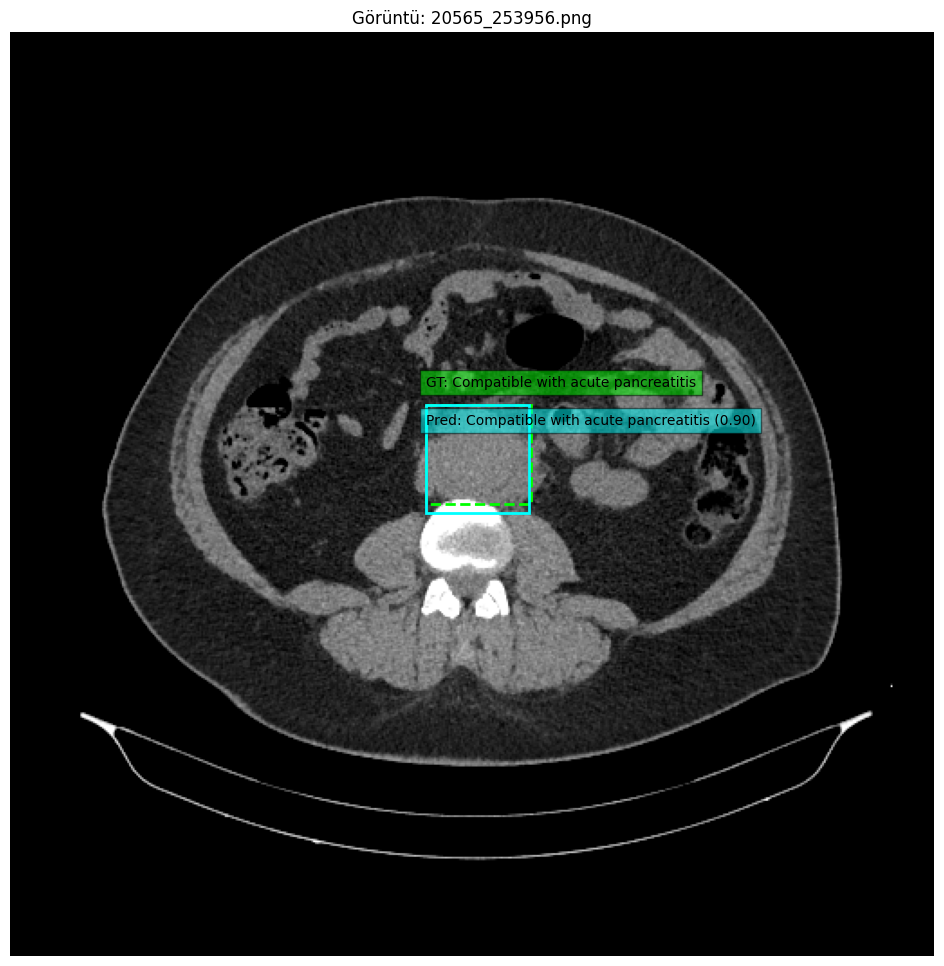

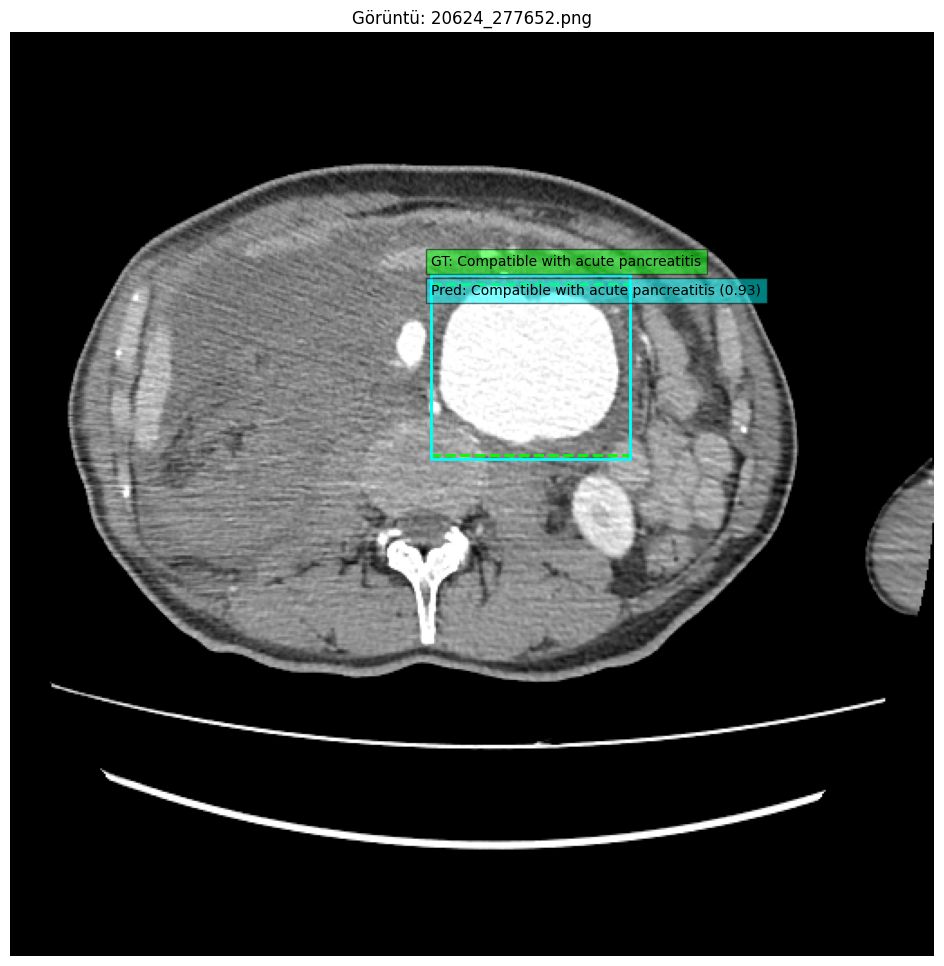

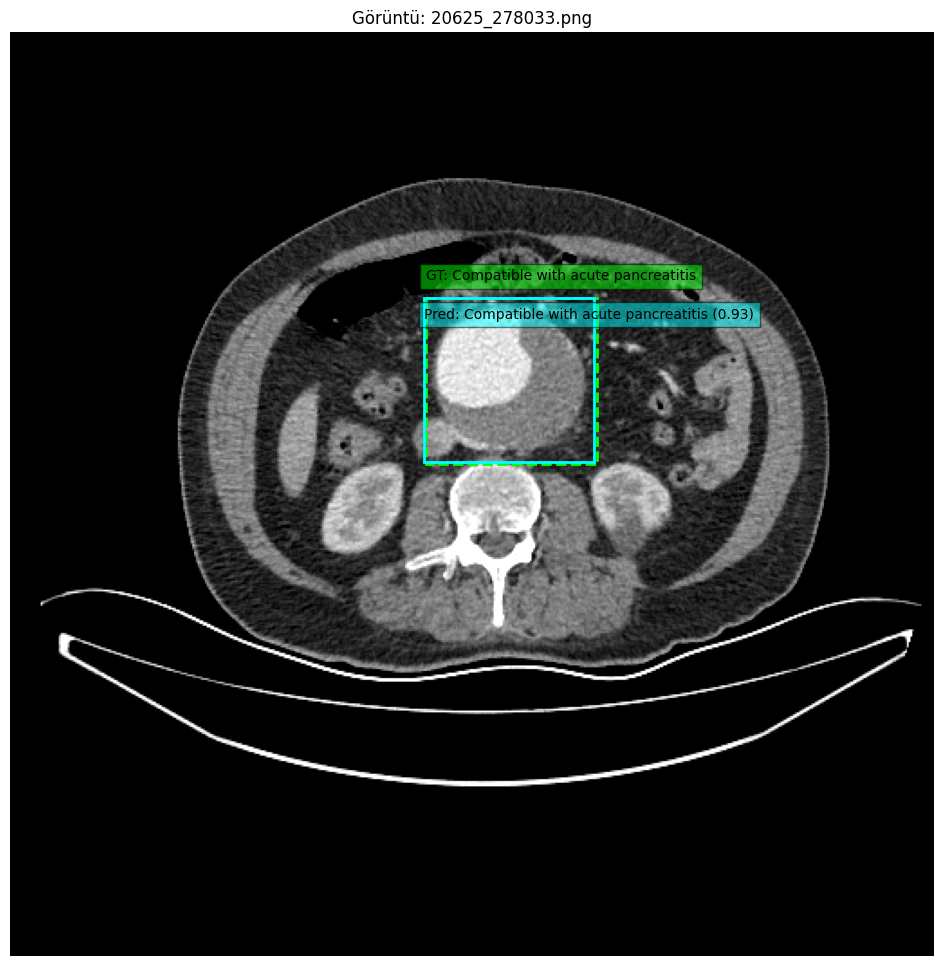

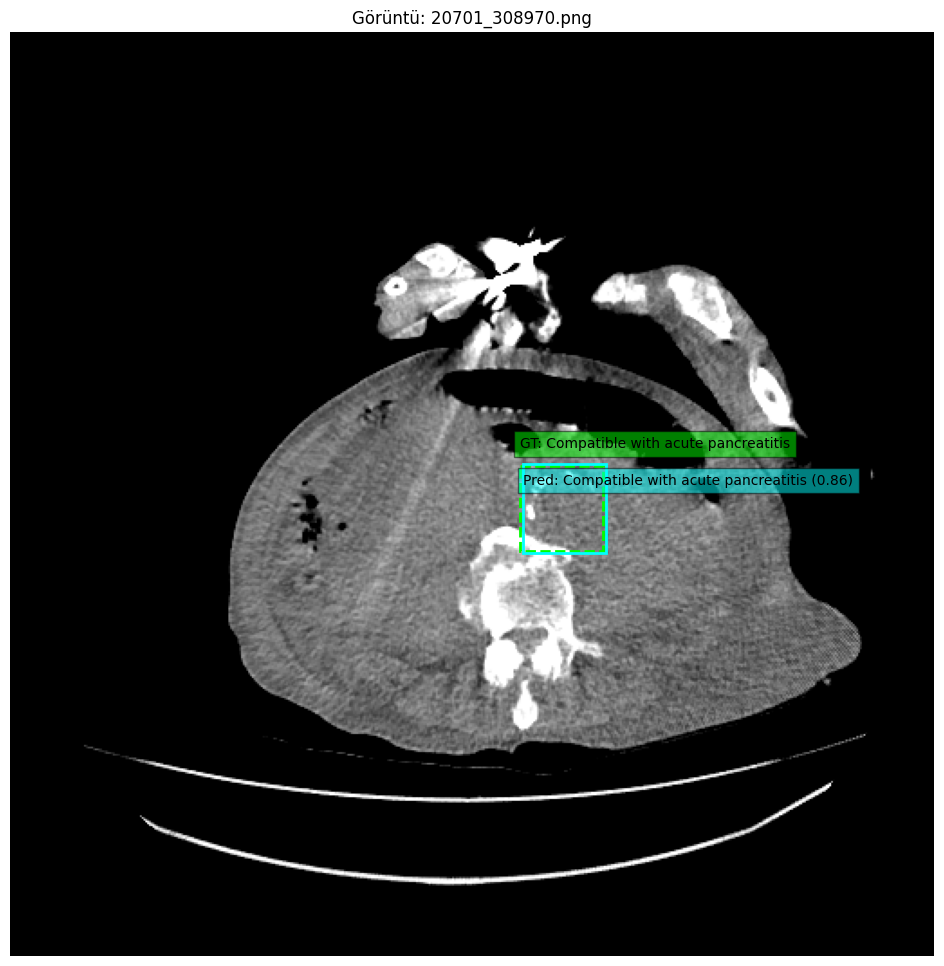

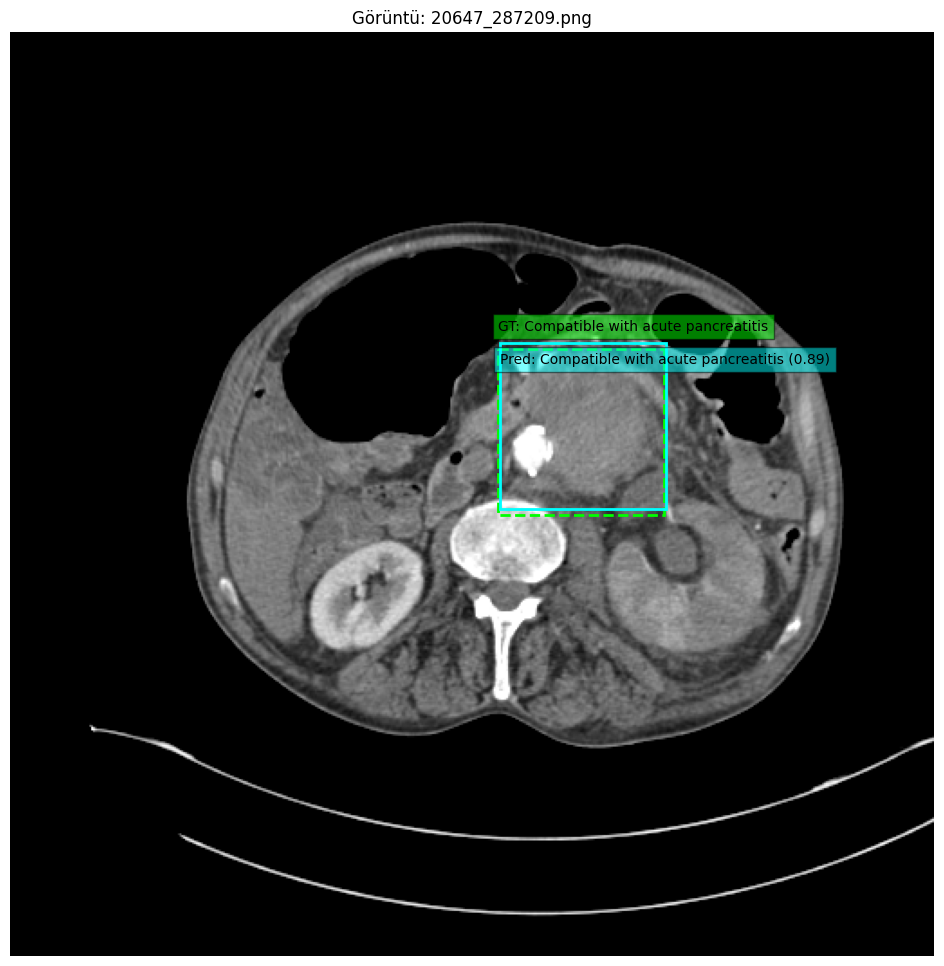


Görselleştirme tamamlandı.


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import cv2
import os
from ultralytics import YOLO # Ensure YOLO is imported

# --- AYARLAR ---
# 1. Eğitilmiş en iyi modelinizin yolu (Drive'dan veya yerelden)
BEST_MODEL_PATH = '/content/runs/detect/yolov9_abdomen_training6/weights/best.pt' # Kendi modelinizin yolunu buraya yazın

# 2. Sınıf isimleri (data.yaml dosyanızla aynı sırada olmalı)
CLASS_NAMES = [
    "Abdominal aortic aneurysm", "Compatible with acute pancreatitis",
    "Compatible with acute cholecystitis", "Gallbladder stone", "Kidney stone",
    "Abdominal aortic dissection", "ureteral stone",
    "Compatible with acute appendicitis", "Calcified diverticulum",
    "Compatible with acute diverticulitis", "Abdominal Aorta"
]

# 3. Görselleştirme için renkler ve stiller
GT_COLOR = 'lime'      # Gerçek Değer (Ground Truth) kutu rengi (parlak yeşil)
PRED_COLOR = 'cyan'    # Tahmin (Prediction) kutu rengi (parlak mavi)
GT_STYLE = '--'         # Gerçek Değer kutu stili (kesikli çizgi)
PRED_STYLE = '-'         # Tahmin kutu stili (düz çizgi)

# --- BİTİŞ AYARLAR ---


# --- MODELİ VE GÖRÜNTÜLERİ HAZIRLAMA ---
# Önceki koddan `selected_image_paths` listesinin dolu olduğunu varsayıyoruz.
# Eğer değilse, aşağıdaki test kodunu kullanabilirsiniz.
# selected_image_paths = ['/path/to/your/image1.png', '/path/to/your/image2.png']

# Modeli yükle
model = YOLO(BEST_MODEL_PATH)
print(f"Model başarıyla yüklendi: {BEST_MODEL_PATH}")

# --- GÖRSELLEŞTİRME FONKSİYONLARI ---

def visualize_predictions_and_gt(image_path, model, class_names):
    """
    Tek bir görüntü üzerinde hem model tahminlerini hem de gerçek etiketleri çizer.
    """
    # 1. Görüntüyü oku
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"Hata: Görüntü okunamadı: {image_path}")
        return
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_height, img_width = img_rgb.shape[:2]

    # 2. Model ile tahmin yap
    predictions = model(image_path, verbose=False)[0] # verbose=False sessiz tahmin yapar

    # 3. Gerçek etiket (ground truth) dosyasını bul ve oku
    label_path = image_path.replace('/images/', '/labels/').replace('.png', '.txt')
    ground_truth_labels = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            ground_truth_labels = f.readlines()

    # 4. Görselleştirme
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(img_rgb)
    ax.set_title(f"Görüntü: {os.path.basename(image_path)}")
    ax.axis('off')

    # Gerçek Değer Kutularını Çiz
    for gt_label_str in ground_truth_labels:
        parts = gt_label_str.strip().split()
        if len(parts) == 5:
            class_id, cx, cy, w, h = map(float, parts)
            class_id = int(class_id)

            box_w = w * img_width
            box_h = h * img_height
            x_min = (cx * img_width) - (box_w / 2)
            y_min = (cy * img_height) - (box_h / 2)

            class_name = class_names[class_id]

            rect = patches.Rectangle((x_min, y_min), box_w, box_h, linewidth=2,
                                     edgecolor=GT_COLOR, facecolor='none', linestyle=GT_STYLE)
            ax.add_patch(rect)
            ax.text(x_min, y_min - 10, f'GT: {class_name}',
                    bbox=dict(facecolor=GT_COLOR, alpha=0.5), fontsize=10, color='black')

    # Tahmin Edilen Kutuları Çiz
    for box in predictions.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf[0].item()
        class_id = int(box.cls[0].item())
        class_name = class_names[class_id]

        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                                 edgecolor=PRED_COLOR, facecolor='none', linestyle=PRED_STYLE)
        ax.add_patch(rect)
        ax.text(x1, y1 + 5, f'Pred: {class_name} ({conf:.2f})',
                bbox=dict(facecolor=PRED_COLOR, alpha=0.5), fontsize=10, color='black', verticalalignment='top')

    plt.show()

# --- ANA ÇALIŞTIRMA KISMI ---
# `selected_image_paths` listesinin bir önceki kod hücresinde oluşturulduğunu varsayıyoruz.
if 'selected_image_paths' in locals() and selected_image_paths:
    print(f"\n{len(selected_image_paths)} adet rastgele seçilmiş görüntü için görselleştirme başlıyor...")
    for image_path in selected_image_paths:
        visualize_predictions_and_gt(image_path, model, CLASS_NAMES)
    print("\nGörselleştirme tamamlandı.")
else:
    print("\n'selected_image_paths' listesi bulunamadı veya boş. Lütfen önce test görüntülerini seçen kodu çalıştırın.")

YOLOv11 modelinin karın bölgesi nesne tespiti performansı, veri artırma ve hiperparametre optimizasyonu teknikleri uygulanarak ve değerlendirilerek optimize edilir.

Eğitim kodunu, belirtilen veri büyütme tekniklerini (mozaik, rastgele döndürme, ölçekleme, çevirme) içerecek şekilde değiştirin.

# Dikkat modelleri eklenmesi


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!mkdir -p /content/yolo_proj
%cd /content/yolo_proj


/content/yolo_proj


In [ ]:
!git clone https://github.com/ultralytics/ultralytics.git
%cd ultralytics


Cloning into 'ultralytics'...
remote: Enumerating objects: 61874, done.
remote: Counting objects: 100% (253/253), done.
remote: Compressing objects: 100% (161/161), done.
remote: Total 61874 (delta 173), reused 124 (delta 92), pack-reused 61621 (from 3)
Receiving objects: 100% (61874/61874), 33.49 MiB | 31.85 MiB/s, done.
Resolving deltas: 100% (46049/46049), done.
/content/yolo_proj/ultralytics


In [ ]:
# 1) Gereksinimleri yükle
!pip install -r requirements.txt -q
# 2) Editable kurulum
!pip install -e . -q

ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5

In [ ]:
%cd /content/yolo_proj/ultralytics
!pip install -e . -q

/content/yolo_proj/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done


 Attention Mekanizmaları: SEBlock, CBAM ve ECAAttention

  Kullanım Amacı: YOLOv9 mimarisine kanal/spatial attention modülleri eklemek

 Konum: ultralytics/ultralytics/nn/modules/cbam_se.py

 Eğitim sırasında model.yaml içinde bu bloklar tanımlanarak entegre edilir

In [ ]:
%%writefile /content/yolo_proj/ultralytics/ultralytics/nn/modules/cbam_se.py
import torch, torch.nn as nn

# ───────── SEBlock ─────────
class SEBlock(nn.Module):
    def __init__(self, ch=0, r=16):
        super().__init__()
        self.ch, self.r = ch, r
        if ch > 0:
            self._build(ch)

    def _build(self, ch):
        self.avg = nn.AdaptiveAvgPool2d(1)
        self.fc1 = nn.Conv2d(ch, max(ch // self.r, 1), 1, bias=False)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Conv2d(max(ch // self.r, 1), ch, 1, bias=False)
        self.sig = nn.Sigmoid()

    def forward(self, x):
        if not hasattr(self, "avg"):
            self._build(x.shape[1])
            self.to(x.device, dtype=x.dtype)
        y = self.sig(self.fc2(self.relu(self.fc1(self.avg(x)))))
        return x * y

# ───────── CBAM ─────────
class CBAM(nn.Module):
    def __init__(self, ch=0):
        super().__init__()
        self.ch = ch
        if ch > 0:
            self._build(ch)

    def _build(self, ch):
        self.se   = SEBlock(ch)
        self.conv = nn.Conv2d(2, 1, 7, padding=3, bias=False)
        self.sig  = nn.Sigmoid()

    def forward(self, x):
        if not hasattr(self, "se"):
            self._build(x.shape[1])
            self.to(x.device, dtype=x.dtype)
        x = self.se(x)
        m = torch.cat((x.mean(1, keepdim=True), x.max(1, keepdim=True)[0]), 1)
        return x * self.sig(self.conv(m))

# ───────── ECAAttention ─────────
class ECAAttention(nn.Module):
    def __init__(self, ch=0, k=3):
        super().__init__()
        self.ch, self.k = ch, k
        if ch > 0:
            self._build(ch)

    def _build(self, ch):
        self.avg  = nn.AdaptiveAvgPool2d(1)
        self.conv = nn.Conv1d(1, 1, kernel_size=self.k,
                              padding=(self.k - 1) // 2, bias=False)
        self.sig  = nn.Sigmoid()

    def forward(self, x):
        if not hasattr(self, "avg"):
            self._build(x.shape[1])
            self.to(x.device, dtype=x.dtype)
        y = self.avg(x).squeeze(-1).transpose(-1, -2)
        y = self.sig(self.conv(y)).transpose(-1, -2).unsqueeze(-1)
        return x * y

# --- Auto-register if tasks was already imported (edge-case insurance) ---
import sys
if "ultralytics.nn.tasks" in sys.modules:
    t = sys.modules["ultralytics.nn.tasks"].__dict__
    t.update({"CBAM": CBAM, "SEBlock": SEBlock, "ECAAttention": ECAAttention})


Writing /content/yolo_proj/ultralytics/ultralytics/nn/modules/cbam_se.py


Bu satırlar, cbam_se.py dosyasında tanımlı CBAM, SEBlock ve ECAAttention modüllerini ultralytics.nn.modules alt modülüne otomatik olarak dahil eder.

In [ ]:
%%writefile -a /content/yolo_proj/ultralytics/ultralytics/nn/modules/__init__.py



from .cbam_se import CBAM, SEBlock, ECAAttention

# 2. Bu sınıflar __all__ listesine eklenerek dışarıya açık hale getirilir
__all__ += ('CBAM', 'SEBlock', 'ECAAttention')

# 3. Bu sınıflar global namespace'e eklenir (model.yaml içinden doğrudan erişim için)
globals().update({'CBAM': CBAM, 'SEBlock': SEBlock, 'ECAAttention': ECAAttention})


Appending to /content/yolo_proj/ultralytics/ultralytics/nn/modules/__init__.py


In [ ]:
%cd /content/yolo_proj/ultralytics
!pip install -e . -q


/content/yolo_proj/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done


In [ ]:
# ① satırlar gerçekten dosyada mı?
!tail -n 6 /content/yolo_proj/ultralytics/ultralytics/nn/modules/__init__.py

    "A2C2f",
)
# --- Custom attention blocks auto-register ---
from .cbam_se import CBAM, SEBlock, ECAAttention
__all__ += ('CBAM', 'SEBlock', 'ECAAttention')
globals().update({'CBAM': CBAM, 'SEBlock': SEBlock, 'ECAAttention': ECAAttention})


In [ ]:
# ② editable kurulumu tazele
%cd /content/yolo_proj/ultralytics
#!pip install -e . -q

/content/yolo_proj/ultralytics
/bin/bash: line 1: pip install -e . -q: command not found


In [ ]:
#ultralytics.nn.tasks modülüne globals().update(...) yoluyla CBAM, SEBlock ve
#ECAAttention sınıfları başarıyla register edildi.
import ultralytics.nn.tasks as t
print('CBAM' in t.__dict__, 'SEBlock' in t.__dict__, 'ECAAttention' in t.__dict__)
# -> True True True


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
True True True


In [ ]:
#yolov9-cbam.yaml – YOLOv9 + CBAM Konfigürasyon Özeti
%%writefile /content/yolo_proj/yolov9-cbam.yaml
# YOLOv9 + CBAM  (core v9-c, width_multiple 0.34)
nc: 11
depth_multiple: 0.34
width_multiple: 0.34
in_channels: [3]

backbone:
  - [-1, 1, Conv,  [64, 3, 2]]
  - [-1, 1, Conv,  [128, 3, 2]]
  - [-1, 3, C2f,   [128]]
  - [-1, 1, Conv,  [256, 3, 2]]
  - [-1, 3, C2f,   [256]]
  - [-1, 1, Conv,  [512, 3, 2]]
  - [-1, 1, CBAM,  [176]]        # 512→176 ch
  - [-1, 3, C2f,   [512]]
  - [-1, 1, Conv,  [768, 3, 2]]
  - [-1, 3, C2f,   [768]]
  - [-1, 1, SPPF,  [768, 5]]

head:
  - [-1, 1, Conv,           [768, 3, 1]]
  - [[-1, -2, -3], 1, Detect, [nc]]



Writing /content/yolo_proj/yolov9-cbam.yaml


In [ ]:
#yolov9-se.yaml – YOLOv9 + SEBlock Yapılandırma Dosyası
%%writefile /content/yolo_proj/yolov9-se.yaml
# YOLOv9 + SEBlock
nc: 11
depth_multiple: 0.34
width_multiple: 0.34
in_channels: [3]

backbone:
  - [-1, 1, Conv,  [64, 3, 2]]
  - [-1, 1, Conv,  [128, 3, 2]]
  - [-1, 3, C2f,   [128]]
  - [-1, 1, Conv,  [256, 3, 2]]
  - [-1, 3, C2f,   [256]]
  - [-1, 1, Conv,  [512, 3, 2]]
  - [-1, 3, C2f,   [512]]
  - [-1, 1, SEBlock, [176]]     # 512→176
  - [-1, 1, Conv,  [768, 3, 2]]
  - [-1, 3, C2f,   [768]]
  - [-1, 1, SPPF,  [768, 5]]

head:
  - [-1, 1, Conv,           [768, 3, 1]]
  - [[-1, -2, -3], 1, Detect, [nc]]



Writing /content/yolo_proj/yolov9-se.yaml


In [ ]:
#yolov9-eca.yaml – YOLOv9 + ECAAttention Yapılandırma Dosyası
%%writefile /content/yolo_proj/yolov9-eca.yaml
# YOLOv9 + ECAAttention
nc: 11
depth_multiple: 0.34
width_multiple: 0.34
in_channels: [3]

backbone:
  - [-1, 1, Conv,  [64, 3, 2]]
  - [-1, 1, Conv,  [128, 3, 2]]
  - [-1, 3, C2f,   [128]]
  - [-1, 1, Conv,  [256, 3, 2]]
  - [-1, 3, C2f,   [256]]
  - [-1, 1, Conv,  [512, 3, 2]]
  - [-1, 3, C2f,   [512]]
  - [-1, 1, Conv,  [768, 3, 2]]
  - [-1, 3, C2f,   [768]]
  - [-1, 1, SPPF,  [768, 5]]

head:
  - [-1, 1, ECAAttention, [264]]     # 768×0.34 → 264 kanal
  - [-1, 1, Conv,         [768, 3, 1]]
  - [[-1, -2, -3], 1,     Detect,    [nc]]   # ✅ from alanı liste

Writing /content/yolo_proj/yolov9-eca.yaml


In [ ]:
#hyp_cbamse.yaml – YOLOv9 için Hafif Veri Artırımı ve Eğitim Hiperparametreleri
%%writefile /content/yolo_proj/hyp_cbamse.yaml
# Basit, hafif augment – hız dostu
lr0: 0.003
lrf: 0.01
momentum: 0.92
weight_decay: 0.00045
warmup_epochs: 3.0
warmup_momentum: 0.5
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
degrees: 0.0
translate: 0.05   # hafif
scale: 0.5
shear: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 0.5       # 1.0 → 0.5
mixup: 0.0
copy_paste: 0.0


Writing /content/yolo_proj/hyp_cbamse.yaml


In [ ]:
%cd /content/yolo_proj/ultralytics
!pip install -e . -q


/content/yolo_proj/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done


Bu script, /content/yolo_proj klasöründeki yolov9-*.yaml formatındaki tüm YOLO
model konfigürasyon dosyalarını kontrol eder ve kriterlere göre olası yapısal hataları tespit eder

In [ ]:

import yaml, pathlib, pprint, textwrap, re

yamls = pathlib.Path("/content/yolo_proj").glob("yolov9-*.yaml")
def bad(layer):  # dört öğe değilse veya Detect + from tek int ise True döner
    if not (isinstance(layer, list) and len(layer) == 4):
        return True
    m = layer[2]
    if m in {"Detect", "YOLOEDetect", "YOLOESegment"} and isinstance(layer[0], int):
        return True
    return False

for y in yamls:
    cfg = yaml.safe_load(open(y))
    issues = [(i, l) for i, l in enumerate(cfg["backbone"] + cfg["head"]) if bad(l)]
    if not issues:
        print(f"✅ {y.name} sağlam")
    else:
        print(f"❌ {y.name} – hatalı katman(lar):")
        for i, l in issues:
            print(f"  satır {i:>3}: {textwrap.shorten(str(l), 100)}")


✅ yolov9-eca.yaml sağlam
✅ yolov9-se.yaml sağlam
✅ yolov9-cbam.yaml sağlam


In [ ]:
# ⏬ Tek Hücre – Zip’ten Çöz • Eğitim • Tahmin • Ensemble • Drive yedek
import subprocess, os, datetime, shutil, zipfile, yaml, numpy as np
from pathlib import Path
from ultralytics import YOLO

# ───── 1) ZIP’i aç (bir kere) ─────
ZIP_PATH  = "/content/YOLO_hazir_dataset.zip"        # Colab’a yüklediğiniz zip
LOCAL_DS  = "/content/dataset"                       # unzip hedefi
if not Path(LOCAL_DS, "images").exists():
    print(f"📂 {ZIP_PATH} açılıyor …")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(LOCAL_DS)
    print("✅ Çözme tamam.")

# ───── 2) Yol Ayarları ─────
DATA_YAML  = f"{LOCAL_DS}/data.yaml"
LOCAL_PROJ = "/content/yolo_proj"
DRIVE_PROJ = "/content/drive/MyDrive/abdomen/yolo_proj"   # Sonuç yedeği için
HYP_FILE   = f"{LOCAL_PROJ}/hyp_cbamse.yaml"

CFGs = {
    "cbam": f"{LOCAL_PROJ}/yolov9-cbam.yaml",
    "se"  : f"{LOCAL_PROJ}/yolov9-se.yaml",
    "eca" : f"{LOCAL_PROJ}/yolov9-eca.yaml"
}

# ───── 3) Eğitim Parametreleri ─────
EPOCHS = 100
IMG    = 640
BATCH  = 64
DEVICE = "0"
WORKERS = 8
hyp_dict = yaml.safe_load(open(HYP_FILE))
hyp_dict["mosaic"] = 0.5   # augment hafiflet (isteğe bağlı)

# ───── 4) TensorBoard ─────
subprocess.Popen(
    ["tensorboard", "--logdir=/content/runs", "--port=6006", "--host=0.0.0.0"],
    stdout=subprocess.DEVNULL, stderr=subprocess.STDOUT)
print("📊 TensorBoard 6006 portunda (sağ tık ▶ Open).")

# ───── 5) Eğitim Döngüsü ─────
for tag, cfg in CFGs.items():
    print(f"\n🚀 Training {tag.upper()}")
    YOLO(cfg).train(
        data      = DATA_YAML,
        epochs    = EPOCHS,
        imgsz     = IMG,
        batch     = BATCH,
        workers   = WORKERS,
        cache     = "ram",      # ilk epoch yavaş, sonrası çok hızlı
        amp       = True,
        device    = DEVICE,
        name      = tag,
        **hyp_dict
    )

# ───── 6) Tahmin ─────
TEST_SRC  = f"{LOCAL_DS}/images/test"
pred_dirs = []
for tag in CFGs:
    weight = f"/content/runs/detect/{tag}/weights/best.pt"
    out    = f"{tag}_preds"; pred_dirs.append(out)
    print(f"\n🔍 Predict {tag.upper()} → {out}")
    YOLO(weight).predict(
        source   = TEST_SRC,
        conf     = 0.25,
        save     = True,
        save_txt = True,
        name     = out
    )

# ───── 7) Ensemble ─────
print("\n🧠 Ensemble…")
ens_dir = Path("/content/ensemble_output"); ens_dir.mkdir(exist_ok=True)
agg = {}
for d in pred_dirs:
    for p in Path(f"/content/runs/detect/{d}/labels").glob("*.txt"):
        agg.setdefault(p.name, []).append(np.loadtxt(p))
for fn, arrs in agg.items():
    np.savetxt(ens_dir/fn, np.mean(np.stack(arrs), 0), fmt="%.6f")
print("✅ Ensemble tamamlandı:", ens_dir)

# ───── 8) Drive Yedeği ─────
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M")
bk_root = f"{DRIVE_PROJ}/results_{ts}"
print(f"💾 Çıktılar Drive’a kopyalanıyor → {bk_root}")
shutil.copytree("/content/runs", bk_root + "/runs")
shutil.copytree(ens_dir,        bk_root + "/ensemble")
for cfg in CFGs.values():
    shutil.copy2(cfg, bk_root)
shutil.copy2(HYP_FILE, bk_root)
print("🎉 Tamamlandı!  (TensorBoard link: http://localhost:6006)")


📊 TensorBoard 6006 portunda (sağ tık ▶ Open).
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 255).
Contents of stderr:
E0000 00:00:1752014365.590707   37463 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752014365.596476   37463 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

E0708 22:39:29.727361 137336234366080 program.py:300] TensorBoard could not bind to port 6006, it was already in use
ERROR: TensorBoard could not bind to port 6006, it was already in use


🚀 Training CBAM
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=ram, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo_proj/yolov9-cbam.yaml, momentum=0.92, mosaic=0.5, multi_scale=False, name=cbam3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, pe

train: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/train.cache... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:00<?, ?it/s]

train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_1143

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (18.0GB RAM): 100%|██████████| 15747/15747 [3:03:53<00:00,  1.43it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.4±0.0 ms, read: 25.1±12.1 MB/s, size: 65.6 KB)


val: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/val.cache... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:00<?, ?it/s]

val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
v

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (3.9GB RAM): 100%|██████████| 3374/3374 [00:25<00:00, 133.36it/s]


Plotting labels to /content/yolo_proj/ultralytics/runs/detect/cbam3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.92' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 36 weight(decay=0.0), 46 weight(decay=0.00045), 42 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/yolo_proj/ultralytics/runs/detect/cbam3
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      8.23G      4.285      15.95      2.756          3        640: 100%|██████████| 247/247 [00:45<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.10it/s]


                   all       3374       3719       0.89     0.0744     0.0748     0.0301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      9.84G      2.219      2.562      1.382          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.435      0.152      0.162     0.0775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      9.84G      1.859      1.455      1.179          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.452      0.167      0.193     0.0996

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      9.84G      1.694      1.186      1.104          8        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719       0.47      0.185      0.221       0.11

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      9.84G      1.586       1.05      1.064          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.512      0.203      0.216      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      9.85G      1.492     0.9615      1.035          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.639      0.194      0.217      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      9.85G      1.453     0.9148      1.017          4        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


                   all       3374       3719      0.638      0.242      0.281      0.161

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      9.85G      1.394     0.8588      1.002          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.688      0.235       0.31      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      9.85G      1.364     0.8328     0.9928          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


                   all       3374       3719      0.557      0.334      0.318      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      9.85G      1.341      0.814     0.9869          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.673      0.305       0.34      0.199

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      9.85G      1.303      0.772     0.9766          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.638      0.316       0.35        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      9.85G      1.278     0.7503     0.9656          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.561      0.346      0.347      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      9.85G      1.266     0.7364     0.9614          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.667      0.322      0.344      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      9.85G      1.233     0.7115     0.9542          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.662      0.355      0.394      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      9.85G      1.212     0.6886       0.95          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.683      0.345      0.381      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      9.85G      1.205     0.6857     0.9438          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]

                   all       3374       3719      0.633      0.377      0.392      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      9.85G      1.189     0.6707      0.944          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.28it/s]


                   all       3374       3719      0.692      0.368      0.401      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      9.85G      1.179     0.6555     0.9397          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.605      0.387      0.407      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      9.85G      1.159     0.6412      0.933          8        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.662      0.388      0.415      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      9.85G       1.15     0.6354     0.9299          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.635      0.385      0.415       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      9.86G      1.126     0.6223     0.9266          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.659      0.402      0.432      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      9.86G      1.113     0.6019     0.9219          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.702      0.389       0.44       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      9.86G      1.095     0.5894     0.9182          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.467      0.488      0.472      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      9.86G      1.083     0.5863     0.9135          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.719       0.41      0.441      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      9.86G      1.084     0.5806     0.9134          6        640: 100%|██████████| 247/247 [00:44<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.649      0.431       0.45      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      9.86G      1.064     0.5682     0.9104          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.675      0.414      0.478      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      9.86G      1.055     0.5676     0.9067          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]

                   all       3374       3719      0.528      0.488      0.483      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      9.86G      1.041     0.5553     0.9024          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.696      0.459      0.487      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      9.86G       1.03     0.5447     0.9023          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.604      0.426      0.448      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      9.86G      1.032     0.5411     0.9037          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.584       0.43      0.447      0.285
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      9.86G     0.9573     0.4889     0.8879          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.626       0.48      0.494      0.297

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      9.86G     0.9474     0.4779     0.8827          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.656      0.477      0.497      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      9.86G     0.9293     0.4651     0.8822          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.661      0.523      0.544      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      9.86G     0.9186     0.4583     0.8762          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]

                   all       3374       3719      0.727      0.479      0.495       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      9.86G     0.9085     0.4531     0.8742          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.782      0.476      0.502      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      9.86G     0.8975     0.4473     0.8725          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.652      0.523      0.548       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      9.86G     0.8833      0.438     0.8671          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.762      0.486      0.536      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      9.86G     0.8784     0.4335     0.8668          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719       0.76      0.488      0.525      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      9.86G     0.8671     0.4264     0.8668          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]

                   all       3374       3719      0.781      0.491       0.54      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      9.86G     0.8617     0.4253      0.864          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719       0.74      0.519      0.555      0.329

40 epochs completed in 0.619 hours.
Optimizer stripped from /content/yolo_proj/ultralytics/runs/detect/cbam3/weights/last.pt, 13.3MB
Optimizer stripped from /content/yolo_proj/ultralytics/runs/detect/cbam3/weights/best.pt, 13.3MB

Validating /content/yolo_proj/ultralytics/runs/detect/cbam3/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9-cbam summary (fused): 52 layers, 6,565,351 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.01it/s]


                   all       3374       3719       0.74      0.519      0.555      0.329
Abdominal aortic aneurysm          5          5      0.811          1      0.995      0.739
Compatible with acute pancreatitis       1298       1298      0.969      0.992      0.994      0.852
Compatible with acute cholecystitis        121        121      0.733      0.703      0.754      0.287
     Gallbladder stone          5          5          0          0          0          0
          Kidney stone         37         42      0.736      0.167      0.175     0.0816
Abdominal aortic dissection        748        757      0.923      0.931       0.96      0.691
        ureteral stone          2          2          1      0.746      0.995       0.25
Compatible with acute appendicitis       1010       1074      0.834      0.915      0.935      0.595
Calcified diverticulum        216        220      0.599      0.182      0.203     0.0824
Compatible with acute diverticulitis        137        151      0

train: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/train.cache... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:00<?, ?it/s]

train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_1143

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (18.0GB RAM): 100%|██████████| 15747/15747 [02:23<00:00, 109.57it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 25.9±11.1 MB/s, size: 65.6 KB)


val: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/val.cache... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:00<?, ?it/s]

val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
v

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (3.9GB RAM): 100%|██████████| 3374/3374 [00:29<00:00, 115.08it/s]


Plotting labels to /content/yolo_proj/ultralytics/runs/detect/se/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.92' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 36 weight(decay=0.0), 45 weight(decay=0.00045), 42 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/yolo_proj/ultralytics/runs/detect/se
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      8.18G      4.533      17.46      2.914          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.765     0.0482     0.0537     0.0162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40       9.8G      2.345      2.609      1.439          6        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.309      0.101      0.106     0.0492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40       9.8G      1.893      1.459      1.193          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.531      0.174      0.176     0.0898

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40       9.8G      1.697      1.178      1.106          8        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.552      0.182      0.205     0.0933

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40       9.8G      1.594      1.052      1.069          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.497      0.211      0.244       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40       9.8G      1.501      0.964      1.038          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.517      0.224      0.249      0.139

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40       9.8G      1.457      0.922      1.019          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.735      0.237      0.281      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40       9.8G      1.403     0.8626      1.005          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719       0.71      0.233      0.337      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40       9.8G      1.376     0.8359     0.9957          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719       0.66      0.314      0.322       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40       9.8G      1.348     0.8138     0.9915          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.574      0.311      0.333        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40       9.8G      1.312     0.7813      0.979          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.28it/s]


                   all       3374       3719      0.629      0.326      0.349       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40       9.8G      1.293     0.7578     0.9703          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.543      0.316      0.319      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      9.81G      1.277     0.7404      0.964          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.27it/s]


                   all       3374       3719      0.607      0.371      0.374      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      9.81G      1.243     0.7179      0.957          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.597      0.344      0.366      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      9.82G       1.23     0.6987     0.9553          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


                   all       3374       3719       0.66      0.326      0.367      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      9.82G      1.223     0.6959     0.9492          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.666      0.352      0.393      0.241

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      9.82G      1.201      0.681     0.9481          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.635      0.374      0.403      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      9.82G      1.183     0.6613     0.9406          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.619      0.386      0.414      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      9.82G      1.166     0.6454     0.9346          8        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.665      0.392      0.424      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      9.82G       1.16     0.6399     0.9334          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.692      0.367      0.427      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      9.82G      1.142     0.6276     0.9315          4        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.706      0.374      0.411      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      9.82G      1.123     0.6113     0.9241          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.671      0.412      0.423      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      9.82G      1.106     0.5956     0.9215          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.636      0.419      0.426      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      9.82G      1.095     0.5918     0.9176          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.533      0.485      0.485      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      9.82G      1.093     0.5858     0.9168          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.647      0.423      0.461       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      9.82G      1.073     0.5731     0.9137          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.684      0.418       0.44      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      9.82G      1.065     0.5698     0.9103          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.674      0.433       0.46      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      9.82G      1.053     0.5594     0.9065          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.667      0.476       0.49      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      9.82G      1.038     0.5488     0.9055          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.649       0.44      0.474       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      9.82G      1.041     0.5462     0.9064          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719       0.66      0.436      0.499      0.293
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      9.82G     0.9724     0.4921     0.8914          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.682      0.434      0.454      0.294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      9.82G     0.9523     0.4805      0.885          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.711      0.438      0.508      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      9.82G     0.9405      0.471     0.8857          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.704       0.44      0.507      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      9.82G     0.9287     0.4641     0.8788          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.559      0.509      0.503      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      9.82G     0.9164     0.4587     0.8769          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.622      0.505      0.532      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      9.82G     0.9043     0.4508     0.8748          3        640: 100%|██████████| 247/247 [00:42<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.632      0.507      0.512      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      9.82G     0.8891     0.4417     0.8702          4        640: 100%|██████████| 247/247 [00:42<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.663      0.506      0.511      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      9.82G     0.8838     0.4367     0.8686          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]

                   all       3374       3719      0.673      0.506      0.524      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      9.82G     0.8766     0.4329     0.8698          4        640: 100%|██████████| 247/247 [00:42<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.596      0.511      0.522      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      9.82G     0.8708     0.4291     0.8662          3        640: 100%|██████████| 247/247 [00:42<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]

                   all       3374       3719      0.588      0.514      0.528      0.315



40 epochs completed in 0.619 hours.
Optimizer stripped from /content/yolo_proj/ultralytics/runs/detect/se/weights/last.pt, 13.3MB
Optimizer stripped from /content/yolo_proj/ultralytics/runs/detect/se/weights/best.pt, 13.3MB

Validating /content/yolo_proj/ultralytics/runs/detect/se/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9-se summary (fused): 50 layers, 6,565,253 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:14<00:00,  1.93it/s]


                   all       3374       3719      0.589      0.514      0.528      0.315
Abdominal aortic aneurysm          5          5      0.844          1      0.995      0.723
Compatible with acute pancreatitis       1298       1298      0.963      0.989      0.994       0.85
Compatible with acute cholecystitis        121        121      0.613      0.785      0.761      0.285
     Gallbladder stone          5          5          0          0          0          0
          Kidney stone         37         42      0.773      0.167      0.175     0.0838
Abdominal aortic dissection        748        757      0.869      0.946       0.96      0.687
        ureteral stone          2          2      0.803        0.5      0.662      0.117
Compatible with acute appendicitis       1010       1074      0.729      0.934      0.935       0.59
Calcified diverticulum        216        220      0.496      0.223      0.227     0.0951
Compatible with acute diverticulitis        137        151      0

train: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/train.cache... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:00<?, ?it/s]

train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/train/20054_1143

WARNING ⚠️ train: 27.0GB RAM required to cache images with 50% safety margin but only 15.7/83.5GB available, not caching images
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 28.2±18.2 MB/s, size: 65.6 KB)


val: Scanning /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/labels/val.cache... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:00<?, ?it/s]

val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/drive/MyDrive/abdomen/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
v

WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (3.9GB RAM): 100%|██████████| 3374/3374 [00:10<00:00, 336.34it/s]


Plotting labels to /content/yolo_proj/ultralytics/runs/detect/eca/labels.jpg... 


In [ ]:
#Bu kod bloğu, eğitim verilerinin sıkıştırılmış bir .zip dosyasından çıkarılması için kullanılır.
from pathlib import Path
import subprocess, os, datetime, shutil, zipfile, yaml, numpy as np
ZIP_PATH  = "/content/YOLO_hazir_dataset.zip"        # Colab’a yüklediğiniz zip
LOCAL_DS  = "/content/dataset"                       # unzip hedefi
if not Path(LOCAL_DS, "images").exists():
    print(f"📂 {ZIP_PATH} açılıyor …")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(LOCAL_DS)
    print("✅ Çözme tamam.")

📂 /content/YOLO_hazir_dataset.zip açılıyor …
✅ Çözme tamam.


Bu kod hücresi, YOLOv9 + CBAM / SE / ECA gibi dikkat mekanizmaları içeren modellerin eğitilmesi, test edilmesi, sonuçların ensemble (birleştirme) yapılması ve Google Drive’a yedeklenmesi işlemlerini tek adımda gerçekleştiriyor.

In [ ]:
# ⏬ Tek Hücre – Zip’ten Çöz • Eğitim • Tahmin • Ensemble • Drive yedek
import subprocess, os, datetime, shutil, zipfile, yaml, numpy as np
from pathlib import Path
from ultralytics import YOLO


LOCAL_DS  = "/content/dataset"                       # unzip hedefi
# ───── 2) Yol Ayarları ─────
DATA_YAML  = f"{LOCAL_DS}/YOLO_hazir_dataset/data.yaml"
LOCAL_PROJ = "/content/yolo_proj"
DRIVE_PROJ = "/content/drive/MyDrive/abdomen/yolo_proj"   # Sonuç yedeği için
HYP_FILE   = f"{LOCAL_PROJ}/hyp_cbamse.yaml"

CFGs = {
    "cbam": f"{LOCAL_PROJ}/yolov9-cbam.yaml",
    "se"  : f"{LOCAL_PROJ}/yolov9-se.yaml",
    "eca" : f"{LOCAL_PROJ}/yolov9-eca.yaml"
}

# ───── 3) Eğitim Parametreleri ─────
EPOCHS = 50
IMG    = 640
BATCH  = 64
DEVICE = "0"
WORKERS = 8
hyp_dict = yaml.safe_load(open(HYP_FILE))
hyp_dict["mosaic"] = 0.5   # augment hafiflet (isteğe bağlı)




# ───── 5) Eğitim Döngüsü ─────
for tag, cfg in CFGs.items():
    print(f"\n🚀 Training {tag.upper()}")
    YOLO(cfg).train(
        data      = DATA_YAML,
        epochs    = EPOCHS,
        imgsz     = IMG,
        batch     = BATCH,
        workers   = WORKERS,
        cache     = "disk",
        amp       = True,
        device    = DEVICE,
        name      = tag,
        project   = "/content/runs",   # TensorBoard’un izleyeceği ana klasör
        exist_ok  = True,              # aynı isimli klasör varsa üzerine yaz
        verbose   = True,              # tüm logları detaylı yaz
        **hyp_dict)

# ───── 6) Tahmin ─────
TEST_SRC  = f"{LOCAL_DS}/images/test"
pred_dirs = []
for tag in CFGs:
    weight = f"/content/runs/{tag}/weights/best.pt"
    out    = f"{tag}_preds"; pred_dirs.append(out)
    print(f"\n🔍 Predict {tag.upper()} → {out}")
    YOLO(weight).predict(
        source   = TEST_SRC,
        conf     = 0.25,
        save     = True,
        save_txt = True,
        name     = out
    )

# ───── 7) Ensemble ─────
print("\n🧠 Ensemble…")
ens_dir = Path("/content/ensemble_output"); ens_dir.mkdir(exist_ok=True)
agg = {}
for d in pred_dirs:
    for p in Path(f"/content/runs/detect/{d}/labels").glob("*.txt"):
        agg.setdefault(p.name, []).append(np.loadtxt(p))
for fn, arrs in agg.items():
    np.savetxt(ens_dir/fn, np.mean(np.stack(arrs), 0), fmt="%.6f")
print("✅ Ensemble tamamlandı:", ens_dir)

# ───── 8) Drive Yedeği ─────
ts = datetime.datetime.now().strftime("%Y%m%d_%H%M")
bk_root = f"{DRIVE_PROJ}/results_{ts}"
print(f"💾 Çıktılar Drive’a kopyalanıyor → {bk_root}")
shutil.copytree("/content/runs", bk_root + "/runs")
shutil.copytree(ens_dir,        bk_root + "/ensemble")
for cfg in CFGs.values():
    shutil.copy2(cfg, bk_root)
shutil.copy2(HYP_FILE, bk_root)



🚀 Training CBAM
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/YOLO_hazir_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/yolo_proj/yolov9-cbam.yaml, momentum=0.92, mosaic=0.5, multi_scale=False, name=cbam, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True

train: Scanning /content/dataset/YOLO_hazir_dataset/labels/train... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:15<00:00, 1037.87it/s]

train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114393.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114394.png: 1 duplicate label

train: New cache created: /content/dataset/YOLO_hazir_dataset/labels/train.cache


train: Caching images (11.6GB Disk): 100%|██████████| 15747/15747 [00:31<00:00, 499.50it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1172.5±834.3 MB/s, size: 65.6 KB)


val: Scanning /content/dataset/YOLO_hazir_dataset/labels/val... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:03<00:00, 913.84it/s]

val: /content/dataset/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117163.png: 1 duplicate labels removed
val: /content/dataset/YOLO_haz

val: New cache created: /content/dataset/YOLO_hazir_dataset/labels/val.cache


val: Caching images (2.5GB Disk): 100%|██████████| 3374/3374 [00:05<00:00, 582.77it/s]


Plotting labels to /content/runs/cbam/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.92' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 36 weight(decay=0.0), 46 weight(decay=0.00045), 42 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/runs/cbam
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.23G      5.487      23.07      3.543          4        640: 100%|██████████| 247/247 [00:46<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.19it/s]


                   all       3374       3719      0.916    0.00245    0.00139   0.000314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.85G      3.079      3.834       1.84          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.527     0.0716     0.0586     0.0227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      9.86G      2.163      1.801      1.308          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.507      0.107       0.11     0.0449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.87G      1.819      1.337      1.147          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.757      0.144      0.137     0.0599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      9.88G      1.627      1.121      1.077          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.487      0.193      0.228      0.116

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      9.89G      1.539       1.02      1.044          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.546      0.154      0.175     0.0926

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       9.9G      1.459     0.9409       1.02          2        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.761      0.261      0.244      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50       9.9G      1.414     0.9008      1.006          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.538      0.274      0.288      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.91G      1.381     0.8643     0.9974          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.816      0.202      0.226      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      9.92G      1.358     0.8407     0.9868          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.784      0.254      0.284      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      9.93G      1.321     0.8002     0.9781          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.884      0.216      0.281       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.94G      1.297     0.7771     0.9711          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.594      0.314      0.292      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      9.95G      1.276     0.7609      0.964          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.579      0.311      0.329      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      9.96G      1.256     0.7438     0.9619          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719       0.67      0.304      0.348      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      9.96G      1.232     0.7216     0.9514          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.821       0.33      0.343      0.204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      9.97G      1.226     0.7097     0.9485          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.839      0.332       0.35      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      9.98G      1.214     0.6967     0.9496          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.726       0.29       0.34      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      9.99G      1.188     0.6775     0.9408          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.612      0.373      0.372      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.99G      1.178     0.6649     0.9353          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.624      0.351      0.377       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50        10G      1.159      0.657     0.9341          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


                   all       3374       3719      0.735      0.385      0.401      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50        10G      1.152     0.6468     0.9317          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719       0.83      0.373      0.396      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50        10G      1.137     0.6335     0.9284          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.665       0.38      0.409      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50        10G       1.13     0.6285     0.9228          6        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.661      0.395      0.405      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50        10G      1.123     0.6217     0.9216          5        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.647      0.403      0.422      0.265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50        10G      1.109     0.6101     0.9172          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.656      0.405       0.43      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      10.1G      1.099     0.6033     0.9152          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.722      0.389      0.421      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      10.1G      1.087     0.5889     0.9134          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.697        0.4      0.428      0.269

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      10.1G      1.069     0.5811     0.9093          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.711      0.407      0.442      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      10.1G      1.063     0.5739     0.9087          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]

                   all       3374       3719      0.662      0.414      0.437      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      10.1G      1.051      0.569     0.9024          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.669      0.416      0.457      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      10.1G      1.046     0.5644     0.9054          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]

                   all       3374       3719      0.529      0.478      0.463      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      10.1G      1.026     0.5515      0.898          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]

                   all       3374       3719      0.529      0.493      0.466      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      10.1G      1.021     0.5431     0.8997          5        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.619      0.488      0.498       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      10.1G      1.018      0.536     0.8959          5        640: 100%|██████████| 247/247 [00:44<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.654      0.436      0.463      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      10.1G      1.001     0.5273     0.8902          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]

                   all       3374       3719      0.574      0.444      0.456      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      10.1G     0.9969     0.5239     0.8923          4        640: 100%|██████████| 247/247 [00:44<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719       0.62      0.496      0.503      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      10.1G     0.9929     0.5206     0.8908          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]

                   all       3374       3719      0.581      0.497        0.5      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      10.2G     0.9768     0.5105     0.8855          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]

                   all       3374       3719      0.639      0.493      0.502      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      10.2G     0.9658     0.5011     0.8849          6        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.608      0.499      0.505      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      10.2G     0.9592     0.5002     0.8829          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]

                   all       3374       3719      0.695       0.48      0.506      0.319


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      10.2G     0.9049     0.4493     0.8707          3        640: 100%|██████████| 247/247 [00:45<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]

                   all       3374       3719      0.697       0.48      0.512      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      10.2G     0.8863     0.4405     0.8662          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]

                   all       3374       3719      0.638      0.501      0.515      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      10.2G     0.8776      0.434     0.8662          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]

                   all       3374       3719      0.646      0.501      0.515      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      10.2G     0.8626     0.4224     0.8591          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.638      0.505      0.517      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      10.2G     0.8542       0.42     0.8572          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.675      0.487      0.518      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      10.2G     0.8438      0.414     0.8562          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]

                   all       3374       3719      0.581      0.558      0.549      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      10.2G     0.8347     0.4076     0.8525          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.603      0.559       0.55      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      10.2G     0.8272      0.404      0.851          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]

                   all       3374       3719       0.62      0.556      0.549      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      10.2G     0.8143     0.3952     0.8497          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]

                   all       3374       3719      0.619      0.559      0.552      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      10.3G     0.8077     0.3923     0.8476          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]

                   all       3374       3719      0.617      0.563      0.552      0.348



50 epochs completed in 0.773 hours.
Optimizer stripped from /content/runs/cbam/weights/last.pt, 13.3MB
Optimizer stripped from /content/runs/cbam/weights/best.pt, 13.3MB

Validating /content/runs/cbam/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9-cbam summary (fused): 52 layers, 6,565,351 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  1.96it/s]


                   all       3374       3719      0.618      0.563      0.552      0.348
Abdominal aortic aneurysm          5          5      0.757          1      0.995      0.801
Compatible with acute pancreatitis       1298       1298      0.976      0.992      0.994      0.861
Compatible with acute cholecystitis        121        121      0.717      0.793      0.786      0.312
     Gallbladder stone          5          5          0          0          0          0
          Kidney stone         37         42      0.799       0.19      0.202      0.109
Abdominal aortic dissection        748        757      0.898      0.941      0.961      0.698
        ureteral stone          2          2       0.62          1      0.828      0.282
Compatible with acute appendicitis       1010       1074      0.817      0.927      0.944       0.62
Calcified diverticulum        216        220      0.676      0.232      0.251      0.104
Compatible with acute diverticulitis        137        151      0

train: Scanning /content/dataset/YOLO_hazir_dataset/labels/train.cache... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:00<?, ?it/s]

train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114393.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114394.png: 1 duplicate label


train: Caching images (11.6GB Disk): 100%|██████████| 15747/15747 [00:00<00:00, 41430.08it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.1±0.2 ms, read: 472.1±67.5 MB/s, size: 65.6 KB)


val: Scanning /content/dataset/YOLO_hazir_dataset/labels/val.cache... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:00<?, ?it/s]

val: /content/dataset/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117163.png: 1 duplicate labels removed
val: /content/dataset/YOLO_haz


val: Caching images (2.5GB Disk): 100%|██████████| 3374/3374 [00:00<00:00, 27879.07it/s]


Plotting labels to /content/runs/se/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.92' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 36 weight(decay=0.0), 45 weight(decay=0.00045), 42 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/runs/se
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.27G      5.427      26.02      3.553          4        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.936     0.0249     0.0152     0.0049

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.88G      3.019      4.086      1.807          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]


                   all       3374       3719      0.454     0.0964     0.0749     0.0239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      9.88G      2.189      1.751      1.326          5        640: 100%|██████████| 247/247 [00:44<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.403      0.107      0.135     0.0552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.88G       1.86      1.275      1.185          6        640: 100%|██████████| 247/247 [00:44<00:00,  5.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.781      0.106      0.118     0.0527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      9.88G      1.659      1.073      1.117          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.662      0.179        0.2      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      9.88G       1.57     0.9816       1.08          2        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.536      0.145      0.151     0.0731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      9.88G      1.491     0.9212      1.058          2        640: 100%|██████████| 247/247 [00:44<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.756      0.204      0.229      0.124

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      9.88G      1.438     0.8733      1.039          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.786      0.258      0.254      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.88G      1.396     0.8424      1.028          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.792      0.266      0.251      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      9.88G       1.37     0.8126      1.016          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.864      0.172      0.212      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      9.88G      1.332      0.783      1.005          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.742      0.268      0.284      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.88G      1.311     0.7614     0.9996          4        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719        0.9      0.293      0.326      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      9.88G      1.282     0.7414     0.9887          7        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.755      0.294      0.311      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      9.88G      1.267      0.727     0.9875          3        640: 100%|██████████| 247/247 [00:49<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.845      0.319      0.332      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      9.88G      1.236     0.7065     0.9738          2        640: 100%|██████████| 247/247 [00:49<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.737      0.364       0.33      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      9.88G      1.228     0.6938     0.9703          5        640: 100%|██████████| 247/247 [00:55<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]

                   all       3374       3719      0.704      0.306      0.295      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      9.88G      1.222     0.6863     0.9729          4        640: 100%|██████████| 247/247 [00:49<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.20it/s]

                   all       3374       3719      0.937      0.309      0.374      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      9.88G      1.197      0.665      0.964          4        640: 100%|██████████| 247/247 [00:54<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.641      0.238       0.27      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.88G       1.18     0.6583     0.9592          2        640: 100%|██████████| 247/247 [00:49<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:18<00:00,  1.42it/s]


                   all       3374       3719      0.827      0.346      0.378      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      9.88G       1.16     0.6426     0.9555          2        640: 100%|██████████| 247/247 [00:55<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.645      0.382      0.404      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      9.88G      1.151     0.6303     0.9525          3        640: 100%|██████████| 247/247 [00:55<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.844      0.379      0.392      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      9.88G      1.146     0.6228     0.9509          3        640: 100%|██████████| 247/247 [00:56<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.801      0.389      0.396      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      9.88G      1.127     0.6178     0.9414          6        640: 100%|██████████| 247/247 [00:50<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.616       0.39      0.395      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      9.88G      1.125     0.6139     0.9414          5        640: 100%|██████████| 247/247 [00:56<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.05it/s]


                   all       3374       3719      0.832      0.383      0.404      0.247

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      9.88G      1.109     0.6016     0.9373          4        640: 100%|██████████| 247/247 [00:58<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.847      0.364      0.407      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      9.88G      1.097     0.5946     0.9346          3        640: 100%|██████████| 247/247 [00:58<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.27it/s]


                   all       3374       3719      0.732      0.374      0.406      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      9.88G      1.091     0.5836     0.9325          3        640: 100%|██████████| 247/247 [00:56<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


                   all       3374       3719      0.647      0.405      0.421      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      9.88G      1.073     0.5738     0.9285          3        640: 100%|██████████| 247/247 [00:50<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.29it/s]


                   all       3374       3719      0.657      0.398      0.431      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      9.88G      1.064     0.5683     0.9265          2        640: 100%|██████████| 247/247 [00:53<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.809       0.42       0.43      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      9.88G      1.054     0.5618     0.9217          3        640: 100%|██████████| 247/247 [00:54<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.59it/s]

                   all       3374       3719      0.646      0.413      0.431      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      9.88G       1.05     0.5561     0.9225          7        640: 100%|██████████| 247/247 [00:58<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.643      0.415      0.432      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      9.88G      1.029     0.5463     0.9146          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


                   all       3374       3719      0.592      0.417      0.444      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      9.88G      1.025     0.5391     0.9171          5        640: 100%|██████████| 247/247 [00:51<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.513      0.434       0.44      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      9.88G      1.014     0.5339     0.9118          5        640: 100%|██████████| 247/247 [00:54<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:19<00:00,  1.39it/s]

                   all       3374       3719      0.531      0.435      0.445      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      9.88G      1.004     0.5264      0.908          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]

                   all       3374       3719      0.572      0.426      0.444       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      9.88G      1.001     0.5229     0.9102          4        640: 100%|██████████| 247/247 [00:52<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:18<00:00,  1.46it/s]

                   all       3374       3719       0.59      0.428       0.45      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      9.88G     0.9901     0.5182     0.9064          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.578      0.473      0.462      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      9.88G      0.977     0.5066     0.9007          3        640: 100%|██████████| 247/247 [00:54<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.55it/s]


                   all       3374       3719      0.569      0.473      0.464      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      9.88G     0.9668     0.4976     0.8995          6        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]

                   all       3374       3719      0.561       0.49      0.466      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      9.88G     0.9577      0.497     0.8968          3        640: 100%|██████████| 247/247 [00:55<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:25<00:00,  1.08it/s]

                   all       3374       3719      0.562      0.483      0.465      0.295


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      9.88G     0.9038     0.4517     0.8854          3        640: 100%|██████████| 247/247 [00:45<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.29it/s]


                   all       3374       3719      0.572       0.49      0.494      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      9.88G      0.887     0.4422     0.8815          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.691      0.472      0.497      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      9.88G     0.8753     0.4348      0.879          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.678      0.478      0.496      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      9.88G     0.8631     0.4275     0.8734          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.635      0.489        0.5      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      9.88G     0.8584     0.4237     0.8711          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]

                   all       3374       3719      0.631       0.49       0.53      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      9.88G     0.8436     0.4176     0.8707          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


                   all       3374       3719      0.589      0.498      0.532      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      9.88G     0.8351     0.4126     0.8641          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.42it/s]

                   all       3374       3719      0.579      0.499      0.503      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      9.88G     0.8233     0.4076     0.8623          3        640: 100%|██████████| 247/247 [00:44<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.575      0.517      0.534      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      9.88G     0.8164     0.4024     0.8624          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.564      0.533      0.519      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      9.88G     0.8112      0.399     0.8597          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.554      0.532       0.52       0.31

50 epochs completed in 0.872 hours.
Optimizer stripped from /content/runs/se/weights/last.pt, 13.3MB
Optimizer stripped from /content/runs/se/weights/best.pt, 13.3MB

Validating /content/runs/se/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9-se summary (fused): 50 layers, 6,565,253 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.00it/s]


                   all       3374       3719      0.591      0.498      0.532      0.316
Abdominal aortic aneurysm          5          5      0.776          1      0.995      0.694
Compatible with acute pancreatitis       1298       1298      0.972      0.991      0.994      0.854
Compatible with acute cholecystitis        121        121      0.598       0.69      0.664      0.226
     Gallbladder stone          5          5          0          0          0          0
          Kidney stone         37         42      0.694      0.143      0.168     0.0702
Abdominal aortic dissection        748        757      0.899      0.931      0.956      0.682
        ureteral stone          2          2      0.574        0.5      0.828      0.232
Compatible with acute appendicitis       1010       1074      0.806      0.923      0.928      0.586
Calcified diverticulum        216        220       0.64      0.218      0.235       0.11
Compatible with acute diverticulitis        137        151      0

train: Scanning /content/dataset/YOLO_hazir_dataset/labels/train.cache... 15747 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15747/15747 [00:00<?, ?it/s]

train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114055.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114057.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114058.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20053_114060.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114376.png: 2 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114379.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114383.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114391.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114393.png: 1 duplicate labels removed
train: /content/dataset/YOLO_hazir_dataset/images/train/20054_114394.png: 1 duplicate label


train: Caching images (11.6GB Disk): 100%|██████████| 15747/15747 [00:00<00:00, 40188.42it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 519.5±93.2 MB/s, size: 65.6 KB)


val: Scanning /content/dataset/YOLO_hazir_dataset/labels/val.cache... 3374 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3374/3374 [00:00<?, ?it/s]

val: /content/dataset/YOLO_hazir_dataset/images/val/20054_114378.png: 2 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115741.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115742.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115743.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115746.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115760.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20060_115767.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20063_116874.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117162.png: 1 duplicate labels removed
val: /content/dataset/YOLO_hazir_dataset/images/val/20064_117163.png: 1 duplicate labels removed
val: /content/dataset/YOLO_haz


val: Caching images (2.5GB Disk): 100%|██████████| 3374/3374 [00:00<00:00, 34822.23it/s]


Plotting labels to /content/runs/eca/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.003' and 'momentum=0.92' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 36 weight(decay=0.0), 44 weight(decay=0.00045), 42 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /content/runs/eca
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.19G       5.63      26.19       3.67          4        640: 100%|██████████| 247/247 [01:05<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719    0.00261     0.0665    0.00434    0.00117

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      9.81G      3.183      4.516      1.893          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:21<00:00,  1.23it/s]


                   all       3374       3719      0.225     0.0448     0.0269    0.00851

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      9.81G      2.201      1.786      1.342          5        640: 100%|██████████| 247/247 [00:51<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.363     0.0647     0.0623     0.0225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      9.81G      1.848      1.281      1.181          6        640: 100%|██████████| 247/247 [00:51<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.22it/s]


                   all       3374       3719     0.0251      0.177      0.046     0.0192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      9.81G      1.646       1.08      1.111          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.32it/s]


                   all       3374       3719      0.542      0.155      0.172      0.081

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      9.81G      1.558     0.9827      1.076          2        640: 100%|██████████| 247/247 [00:59<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.556      0.154      0.168     0.0827

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      9.81G      1.484     0.9195      1.055          2        640: 100%|██████████| 247/247 [00:52<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       3374       3719      0.672      0.226       0.28       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      9.81G      1.433     0.8724      1.037          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.773      0.205      0.207      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      9.81G       1.39     0.8445      1.027          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.775      0.294      0.275      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      9.81G      1.367     0.8137      1.015          3        640: 100%|██████████| 247/247 [00:54<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:19<00:00,  1.37it/s]


                   all       3374       3719      0.887      0.219      0.254      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      9.81G       1.33     0.7834      1.004          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.886      0.234      0.255      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      9.81G      1.306     0.7644     0.9986          4        640: 100%|██████████| 247/247 [00:52<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       3374       3719      0.905      0.265      0.299      0.174

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      9.81G      1.287     0.7475     0.9908          7        640: 100%|██████████| 247/247 [00:52<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.767       0.25      0.287      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      9.81G      1.267     0.7284     0.9886          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.862      0.307      0.336      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      9.81G      1.235     0.7103     0.9745          2        640: 100%|██████████| 247/247 [00:56<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.56it/s]


                   all       3374       3719      0.618      0.345      0.345      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      9.81G      1.226     0.6978     0.9723          5        640: 100%|██████████| 247/247 [00:52<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.644      0.342      0.353      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      9.81G      1.227     0.6898     0.9762          4        640: 100%|██████████| 247/247 [00:52<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       3374       3719      0.871      0.295      0.346      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      9.81G      1.199      0.669     0.9641          4        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


                   all       3374       3719      0.649      0.357       0.38      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      9.81G      1.185     0.6616       0.96          2        640: 100%|██████████| 247/247 [00:51<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.767      0.342      0.373      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      9.81G      1.164     0.6455     0.9555          2        640: 100%|██████████| 247/247 [00:55<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]

                   all       3374       3719      0.701      0.364      0.392      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      9.81G      1.161     0.6383     0.9548          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.692      0.376      0.385      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      9.81G      1.149     0.6286     0.9531          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.22it/s]


                   all       3374       3719      0.727      0.386      0.396       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      9.81G      1.131     0.6207     0.9417          6        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]


                   all       3374       3719      0.713      0.372      0.398      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      9.81G      1.135      0.615     0.9447          5        640: 100%|██████████| 247/247 [00:52<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.22it/s]

                   all       3374       3719      0.667      0.382      0.408      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      9.81G      1.116     0.6057     0.9396          4        640: 100%|██████████| 247/247 [00:55<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


                   all       3374       3719      0.689      0.395      0.416      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      9.81G      1.104     0.5981     0.9373          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.686      0.399      0.412      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      9.81G      1.091     0.5833     0.9328          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.21it/s]


                   all       3374       3719       0.64      0.399      0.408      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      9.81G      1.081      0.577     0.9298          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719       0.65      0.392      0.419      0.249

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      9.81G      1.066     0.5716     0.9259          2        640: 100%|██████████| 247/247 [00:52<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.23it/s]

                   all       3374       3719      0.726      0.399      0.426      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      9.81G      1.055     0.5619     0.9208          3        640: 100%|██████████| 247/247 [00:55<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]


                   all       3374       3719      0.854      0.413      0.426      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      9.81G      1.055     0.5603     0.9233          7        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.653      0.404       0.42      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      9.81G      1.031     0.5481     0.9156          3        640: 100%|██████████| 247/247 [00:52<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.20it/s]


                   all       3374       3719      0.671      0.417      0.427      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      9.81G      1.026     0.5401     0.9171          5        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.42it/s]

                   all       3374       3719      0.709      0.416      0.448      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      9.81G       1.02     0.5338      0.913          5        640: 100%|██████████| 247/247 [00:51<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.31it/s]


                   all       3374       3719      0.682       0.41      0.435       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      9.81G          1     0.5266     0.9059          3        640: 100%|██████████| 247/247 [00:55<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:18<00:00,  1.49it/s]


                   all       3374       3719      0.693       0.42      0.437       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      9.81G      1.003     0.5235     0.9096          4        640: 100%|██████████| 247/247 [00:52<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]

                   all       3374       3719      0.698      0.416      0.433      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      9.81G     0.9959     0.5212     0.9068          3        640: 100%|██████████| 247/247 [00:59<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


                   all       3374       3719      0.706      0.423       0.44      0.278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      9.81G     0.9806     0.5091     0.9027          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.19it/s]


                   all       3374       3719       0.69      0.423      0.443      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      9.81G     0.9681     0.5001     0.8991          6        640: 100%|██████████| 247/247 [00:52<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.36it/s]

                   all       3374       3719      0.692      0.417      0.441      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      9.81G     0.9631      0.501     0.8988          3        640: 100%|██████████| 247/247 [00:51<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:22<00:00,  1.21it/s]

                   all       3374       3719      0.685      0.423      0.451       0.28


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      9.81G     0.9048      0.452     0.8859          3        640: 100%|██████████| 247/247 [00:46<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.688      0.427       0.45      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      9.81G     0.8874     0.4431     0.8805          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


                   all       3374       3719       0.65      0.444      0.464      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      9.81G     0.8754     0.4336     0.8799          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.35it/s]


                   all       3374       3719      0.677      0.442      0.456      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      9.81G     0.8633     0.4271     0.8742          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.681      0.445      0.458      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      9.81G     0.8586     0.4256     0.8715          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.33it/s]


                   all       3374       3719      0.675      0.445      0.456      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      9.81G     0.8424      0.418     0.8702          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.40it/s]

                   all       3374       3719      0.661      0.447      0.458      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      9.81G     0.8348     0.4146     0.8643          4        640: 100%|██████████| 247/247 [00:43<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.34it/s]


                   all       3374       3719      0.671      0.449       0.46      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      9.81G     0.8261     0.4103     0.8636          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]

                   all       3374       3719      0.674       0.45      0.461      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      9.81G     0.8152      0.402     0.8628          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.37it/s]

                   all       3374       3719      0.681      0.447       0.46      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      9.81G     0.8095        0.4     0.8603          3        640: 100%|██████████| 247/247 [00:43<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


                   all       3374       3719      0.688      0.447      0.462      0.299

50 epochs completed in 0.918 hours.
Optimizer stripped from /content/runs/eca/weights/last.pt, 13.3MB
Optimizer stripped from /content/runs/eca/weights/best.pt, 13.3MB

Validating /content/runs/eca/weights/best.pt...
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9-eca summary (fused): 48 layers, 6,561,384 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  1.96it/s]


                   all       3374       3719      0.687      0.447      0.462      0.299
Abdominal aortic aneurysm          5          5      0.843          1      0.995      0.708
Compatible with acute pancreatitis       1298       1298      0.977      0.988      0.994      0.857
Compatible with acute cholecystitis        121        121      0.729      0.688      0.736      0.248
     Gallbladder stone          5          5          0          0          0          0
          Kidney stone         37         42      0.857      0.143      0.182     0.0748
Abdominal aortic dissection        748        757      0.913      0.928      0.949      0.682
        ureteral stone          2          2          1          0          0          0
Compatible with acute appendicitis       1010       1074      0.848      0.899      0.919      0.587
Calcified diverticulum        216        220      0.735      0.195      0.225     0.0992
Compatible with acute diverticulitis        137        151      0

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/cbam/weights/best.pt'

In [ ]:
from ultralytics import YOLO
from pathlib    import Path
import numpy    as np
import shutil, datetime, os

# 0) Drive yedeği için proje yolları
LOCAL_PROJ = '/content/yolo_proj'                     # config dosyaların burada
DRIVE_PROJ = '/content/drive/MyDrive/abdomen/results' # burada yedekleyeceğiz

# 1) Tahmin adımı
CFGs     = ['cbam','se','eca']
TEST_SRC = '/content/dataset/YOLO_hazir_dataset/images/test'
pred_dirs = []

for tag in CFGs:
    weight = f'/content/runs/{tag}/weights/best.pt'
    out    = f'{tag}_preds'
    pred_dirs.append(out)
    print(f"\n🔍 Predict {tag.upper()} → runs/{out}/labels")
    YOLO(weight).predict(
        source   = TEST_SRC,
        conf     = 0.25,
        save     = True,
        save_txt = True,
        project  = '/content/runs',   # proje klasörü
        name     = out                # runs/{out}
    )

# 2) Ensemble adımı
print("\n🧠 Ensemble…")
ens_dir = Path('/content/ensemble_output')
ens_dir.mkdir(exist_ok=True)

agg = {}
for out in pred_dirs:
    labels_dir = Path(f'/content/runs/{out}/labels')
    for txt in labels_dir.glob('*.txt'):
        arr = np.loadtxt(txt)
        agg.setdefault(txt.name, []).append(arr)

# tüm modellerin tahminlerini ortala ve kaydet
for fn, arrs in agg.items():
    mean_preds = np.mean(np.stack(arrs, axis=0), axis=0)
    np.savetxt(ens_dir/fn, mean_preds, fmt='%.6f')

print("✅ Ensemble tamamlandı:", ens_dir)

# 3) Sonuçları Drive’a kopyalama (opsiyonel)
ts      = datetime.datetime.now().strftime('%Y%m%d_%H%M')
bk_root = f'{DRIVE_PROJ}/results_{ts}'
os.makedirs(bk_root, exist_ok=True)

# runs klasörünü, ensemble çıktısını ve konfig dosyalarını kopyala
shutil.copytree('/content/runs', f'{bk_root}/runs')
shutil.copytree(str(ens_dir),    f'{bk_root}/ensemble')
for cfg in CFGs:
    shutil.copy2(f'{LOCAL_PROJ}/yolov9-{cfg}.yaml', bk_root)


Streaming output truncated to the last 5000 lines.
image 1773/3375 /content/dataset/YOLO_hazir_dataset/images/test/20521_240724.png: 640x640 1 Compatible with acute appendicitis, 5.5ms
image 1774/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240914.png: 640x640 1 Compatible with acute appendicitis, 5.4ms
image 1775/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240924.png: 640x640 1 Compatible with acute appendicitis, 5.5ms
image 1776/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240938.png: 640x640 1 Compatible with acute appendicitis, 5.5ms
image 1777/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240946.png: 640x640 1 Compatible with acute appendicitis, 5.5ms
image 1778/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240950.png: 640x640 1 Compatible with acute appendicitis, 5.6ms
image 1779/3375 /content/dataset/YOLO_hazir_dataset/images/test/20522_240953.png: 640x640 1 Compatible with acute appendicitis, 5.8ms
image 1780/

ValueError: all input arrays must have the same shape

In [ ]:
from google.colab import drive
import shutil, os


# 2. Kaynak ve hedef yolları
src_dir = '/content/yolo_proj'
dst_dir = '/content/drive/MyDrive/abdomen/content_yolo_proj'

# 3. Önce varsa eski yedeği sil, sonra kopyala
if os.path.exists(dst_dir):
    shutil.rmtree(dst_dir)
shutil.copytree(src_dir, dst_dir)

print(f"✅ yolo_proj klasörü başarıyla kopyalandı: {dst_dir}")


✅ yolo_proj klasörü başarıyla kopyalandı: /content/drive/MyDrive/abdomen/content_yolo_proj
